# Erkennung von Credit Card Default mit Machine Learning

#### downloading the dataset: https://archive.ics.uci.edu/ml/machine-learning-databases/00350/default%20of%20credit%20card%20clients.xls

In the followings a simplified description of the variables:
    
    limit_bal: The amount of the given credit (NT dollar)
    sex : Gender
    education: Level of education
    marriage: marital status
    age: Age of the customers
    payment_status_(month): Status of payment in one of the previous 6 months
    bill_statement_(month): The amount of bill statements (NT dollars)in one of the previous 6 months
    previous_payment_(month): The amount of previous payments (NT dollars) in one of the previous 6 months
    
The target variable ['default_payment_next_month'] indicates whether the customer defaulted on the payment 
in the followings month.

## Laden des Datensatzes und Verwaltung der Datentypen

1.1.1 Import the libraries:

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import warnings
import numpy as np
import random
import seaborn as sns
import plotly.express as px
import plotly.io as pio

plt.style.use('seaborn')
plt.rcParams['figure.figsize'] = [8, 4.5]
plt.rcParams['figure.dpi'] = 300
warnings.simplefilter(action='ignore', category=FutureWarning)

In [4]:
df = pd.read_csv('credit_card_default.csv', index_col=0, na_values='')
print(f' DataFrame enthält {len(df)} Zeilen und {df.shape[1]} Spalten.')

df = pd.read_csv('credit_card_default.csv', index_col=0, na_values='') ###
df.head(5) 

 DataFrame enthält 30000 Zeilen und 24 Spalten.


,limit_bal,sex,education,marriage,age,payment_status_sep,payment_status_aug,payment_status_jul,payment_status_jun,payment_status_may,...,bill_statement_jun,bill_statement_may,bill_statement_apr,previous_payment_sep,previous_payment_aug,previous_payment_jul,previous_payment_jun,previous_payment_may,previous_payment_apr,default_payment_next_month
0,20000,Female,University,Married,24.0,Payment delayed 2 months,Payment delayed 2 months,Payed duly,Payed duly,Unknown,...,0,0,0,0,689,0,0,0,0,1
1,120000,Female,University,Single,26.0,Payed duly,Payment delayed 2 months,Unknown,Unknown,Unknown,...,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,90000,Female,University,Single,34.0,Unknown,Unknown,Unknown,Unknown,Unknown,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,50000,Female,University,Married,37.0,Unknown,Unknown,Unknown,Unknown,Unknown,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,50000,Male,University,Married,57.0,Payed duly,Unknown,Payed duly,Unknown,Unknown,...,20940,19146,19131,2000,36681,10000,9000,689,679,0


1.1.2 Separate the features from the target (y):

In [5]:
X = df.copy() 
y = X.pop('default_payment_next_month')  # separate our Features and our Target

1.1.3 Inspecting the data types:

In [6]:
df.dtypes  # show the data Types of our Dataset

limit_bal                       int64
sex                            object
education                      object
marriage                       object
age                           float64
payment_status_sep             object
payment_status_aug             object
payment_status_jul             object
payment_status_jun             object
payment_status_may             object
payment_status_apr             object
bill_statement_sep              int64
bill_statement_aug              int64
bill_statement_jul              int64
bill_statement_jun              int64
bill_statement_may              int64
bill_statement_apr              int64
previous_payment_sep            int64
previous_payment_aug            int64
previous_payment_jul            int64
previous_payment_jun            int64
previous_payment_may            int64
previous_payment_apr            int64
default_payment_next_month      int64
dtype: object

1.1.4 Memory optimization:

In [7]:
def get_df_memory_usage(df, top_columns=5):

    print('Memory usage ----')
    memory_per_column = df.memory_usage(deep=True) / 1024 ** 2
    print(f'Top {top_columns} columns by memory (MB):')
    print(memory_per_column.sort_values(ascending=False) \
                           .head(top_columns))
    print(f'Total size: {memory_per_column.sum():.4f} MB')

In [8]:
get_df_memory_usage(df, 5)

Memory usage ----
Top 5 columns by memory (MB):
education             1.965001
payment_status_sep    1.954342
payment_status_aug    1.920288
payment_status_jul    1.916343
payment_status_jun    1.904229
dtype: float64
Total size: 20.7012 MB


1.1.5. Convert object columns to categorical :

In [9]:
df_cat = df.copy()
object_columns = df_cat.select_dtypes(include= 'object').columns
df_cat[object_columns] = df_cat[object_columns].astype('category')

In [10]:
get_df_memory_usage(df_cat)

Memory usage ----
Top 5 columns by memory (MB):
Index                   0.228882
bill_statement_aug      0.228882
previous_payment_apr    0.228882
previous_payment_may    0.228882
previous_payment_jun    0.228882
dtype: float64
Total size: 3.9265 MB


## EDA ( Exploratory Data Analysis )

1.2.1 Zusammenfassende Statistiken für numerische Variablen:

In [11]:
df.describe().transpose().round(2)

,count,mean,std,min,25%,50%,75%,max
limit_bal,30000.0,167484.32,129747.66,10000.0,50000.00,140000.0,240000.00,1000000.0
age,29850.0,35.49,9.22,21.0,28.00,34.0,41.00,79.0
bill_statement_sep,30000.0,51223.33,73635.86,-165580.0,3558.75,22381.5,67091.00,964511.0
bill_statement_aug,30000.0,49179.08,71173.77,-69777.0,2984.75,21200.0,64006.25,983931.0
bill_statement_jul,30000.0,47013.15,69349.39,-157264.0,2666.25,20088.5,60164.75,1664089.0
bill_statement_jun,30000.0,43262.95,64332.86,-170000.0,2326.75,19052.0,54506.00,891586.0
bill_statement_may,30000.0,40311.40,60797.16,-81334.0,1763.00,18104.5,50190.50,927171.0
bill_statement_apr,30000.0,38871.76,59554.11,-339603.0,1256.00,17071.0,49198.25,961664.0
previous_payment_sep,30000.0,5663.58,16563.28,0.0,1000.00,2100.0,5006.00,873552.0
previous_payment_aug,30000.0,5921.16,23040.87,0.0,833.00,2009.0,5000.00,1684259.0


1.2.2 Zusammenfassende Statistiken für kategoriale Variablen:

In [12]:
df.describe(include= 'object').transpose()

,count,unique,top,freq
sex,29850,2,Female,18027
education,29850,4,University,13960
marriage,29850,3,Single,15891
payment_status_sep,30000,10,Unknown,17496
payment_status_aug,30000,10,Unknown,19512
payment_status_jul,30000,10,Unknown,19849
payment_status_jun,30000,10,Unknown,20803
payment_status_may,30000,9,Unknown,21493
payment_status_apr,30000,9,Unknown,21181


1.2.3 Die Altersverteilung und  nach Geschlecht :

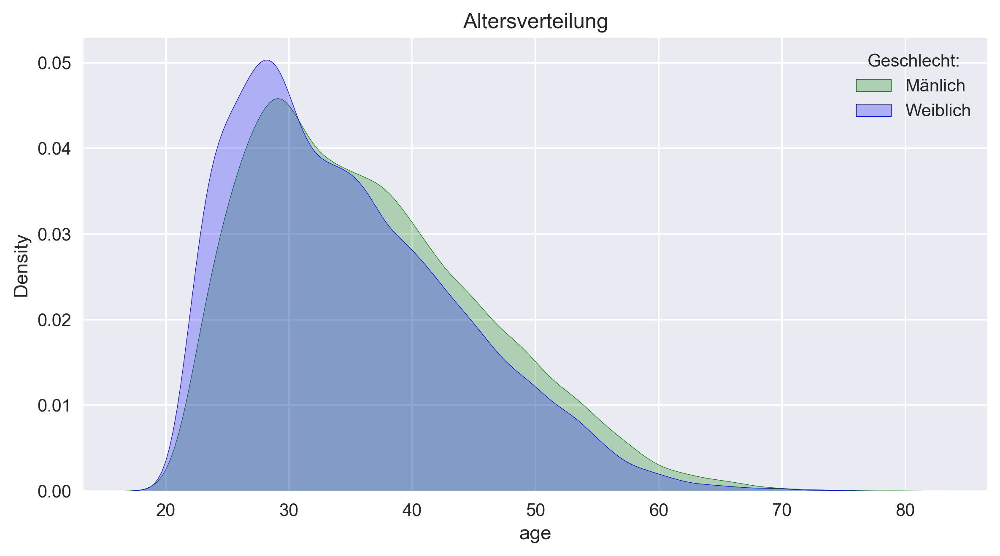

In [13]:
fig, ax = plt.subplots()
sns.distplot(df.loc[df.sex == 'Male','age'].dropna(), 
             hist= False, color= 'green', 
             kde_kws= {'shade': True},
             ax= ax, label= 'Mänlich')
sns.distplot(df.loc[df.sex == 'Female','age'].dropna(), 
             hist= False, color= 'blue', 
             kde_kws={'shade': True},
             ax= ax, label= 'Weiblich')
ax.set_title('Altersverteilung')
ax.legend(title='Geschlecht:')

plt.tight_layout()
plt.show()

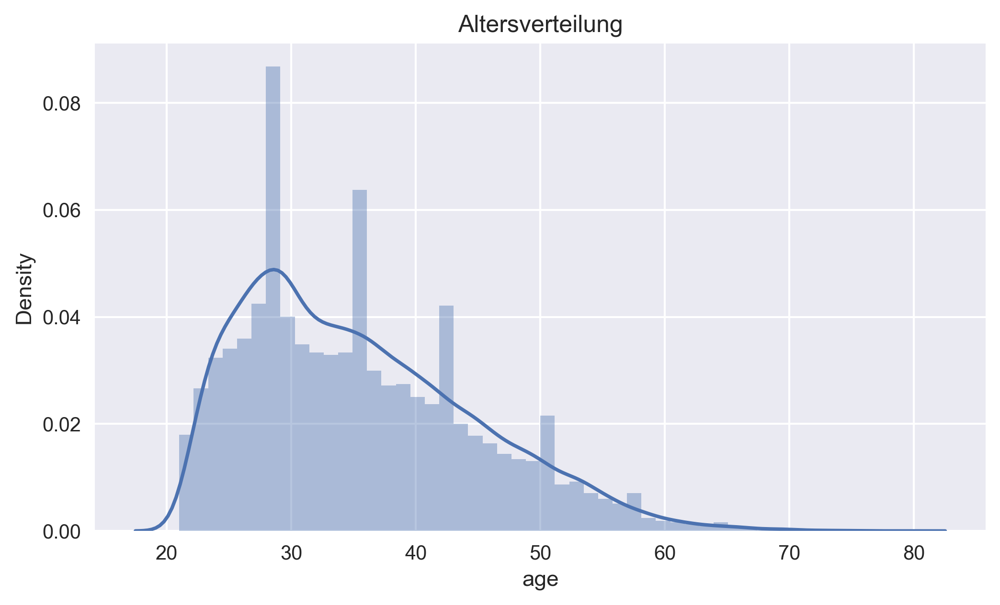

In [14]:
ax = sns.distplot(df.age.dropna(), )
ax.set_title('Altersverteilung');

Kommentar : 

Wir haben festgestellt, dass alle ~10 Jahre einige Spitzen auftreten, was auf das Binning zurückzuführen ist. Nachfolgend haben wir das gleiche Histogramm mit sns.countplot und plotly_express erstellt. Auf diese Weise hat jeder Alterswert ein eigenes Feld, und wir können das Diagramm im Detail untersuchen. In den folgenden Diagrammen gibt es keine derartigen Ausschläge:

1.2.4 Die Altersverteilung und  nach Geschlecht (Histogramm mit sns.countplot und plotly_express):

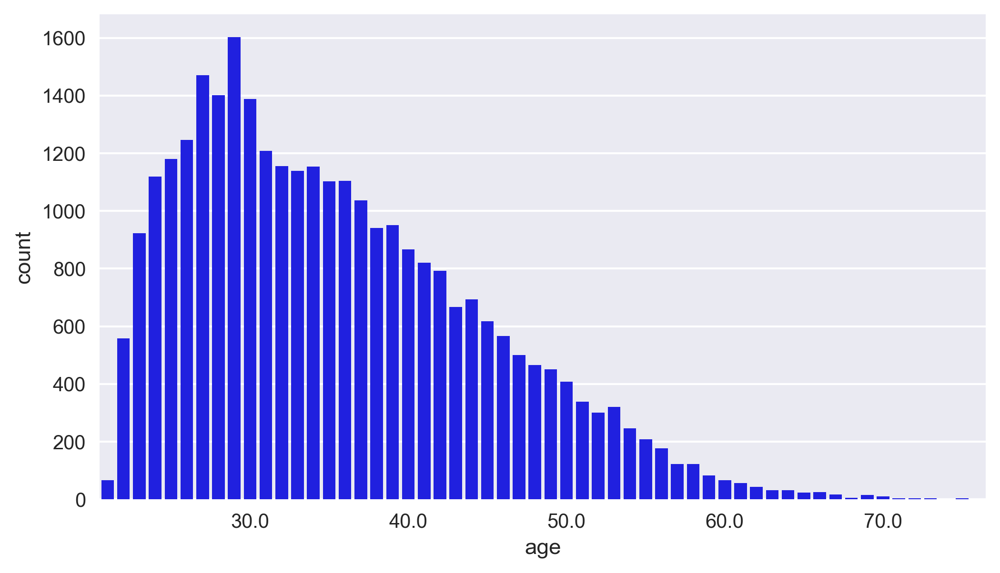

In [15]:
plot_ = sns.countplot(x=df.age.dropna(), color= 'blue')

for ind, label in enumerate(plot_.get_xticklabels()):
    if int(float(label.get_text())) % 10 == 0:
        label.set_visible(True)
    else:
        label.set_visible(False)
#px.histogram(df, x='age', title = 'Altersverteilung')

Wir können die Geschlechter trennen, indem wir das Argument `hue` angeben:

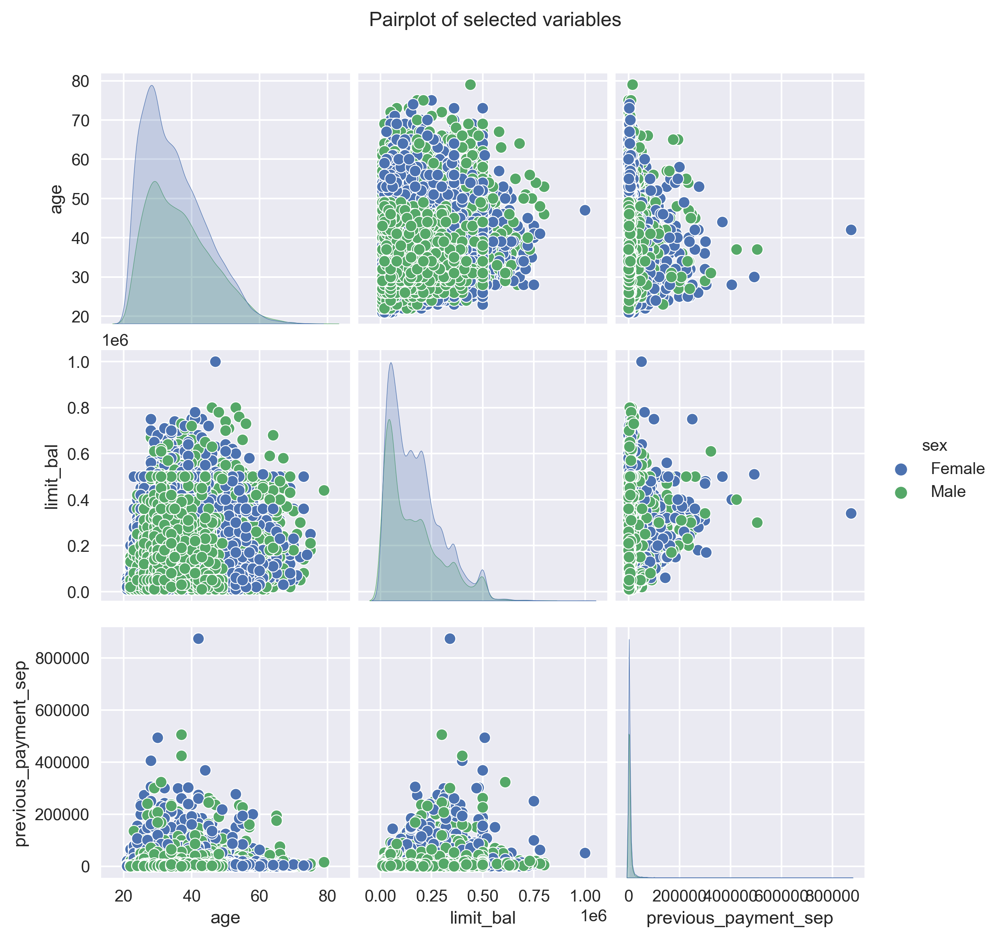

In [16]:
pair_plot = sns.pairplot(df[['sex', 'age', 'limit_bal', 'previous_payment_sep']],  hue='sex')
pair_plot.fig.suptitle('Pairplot of selected variables', y=1.05);

1.2.6 Definieren eine Funktion zur Darstellung der Korrelations-Heatmap:

In [17]:
def plot_correlation_matrix(corr_mat):
    '''
    Parameters
    ----------
    corr_mat : pd.DataFrame
        Correlation matrix of the features.
    '''
    
    # temporarily change style
    sns.set(style='white')
    # mask the upper triangle
    mask = np.zeros_like(corr_mat,dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True
    # set up the matplotlib figure
    fig, ax = plt.subplots()
    # set up custom diverging colormap
    cmap = sns.diverging_palette(240, 10, n=9, as_cmap=True)
    # plot the heatmap
    sns.heatmap(corr_mat, mask=mask, cmap=cmap, vmax=.3, center=0,
                square=True, linewidths=.5, 
                cbar_kws={'shrink': .5}, ax=ax)
    ax.set_title('Correlation Matrix', fontsize=10)
    # change back to darkgrid style
    sns.set(style='darkgrid')

<ipython-input-17-8188309a5dd9>:12: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.zeros_like(corr_mat,dtype=np.bool)


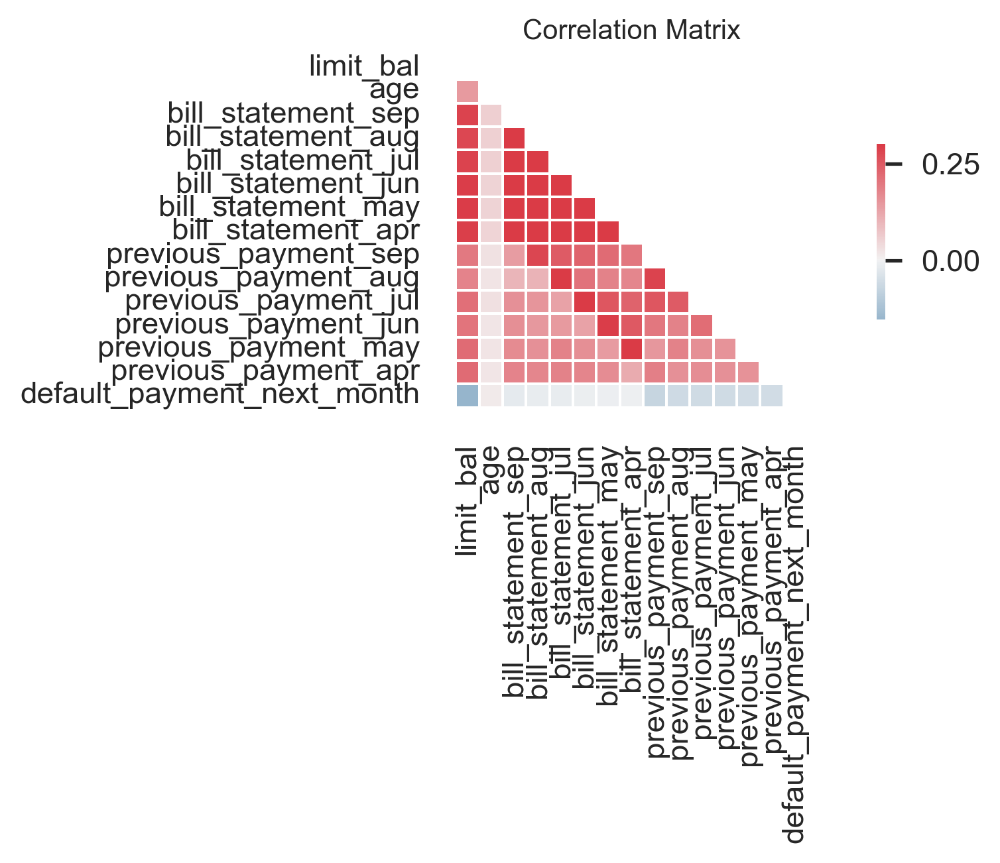

In [18]:
corr_mat = df.select_dtypes(include='number').corr()    
plot_correlation_matrix(corr_mat)

plt.tight_layout()
plt.show()

Kommentar:

Aus der PLOT geht hervor, dass das Alter mit keinem  feature korreliert

Wir können die Korrelation zwischen den (numerischen) features und dem Zielvariable prüfen:

In [19]:
df.select_dtypes(include='number').corr()[['default_payment_next_month']]

,default_payment_next_month
limit_bal,-0.153520
age,0.014491
bill_statement_sep,-0.019644
bill_statement_aug,-0.014193
bill_statement_jul,-0.014076
bill_statement_jun,-0.010156
bill_statement_may,-0.006760
bill_statement_apr,-0.005372
previous_payment_sep,-0.072929
previous_payment_aug,-0.058579


1.2.7 Plotten die Verteilung des limit balance für jedes Geschlecht und Bildungsgrad:

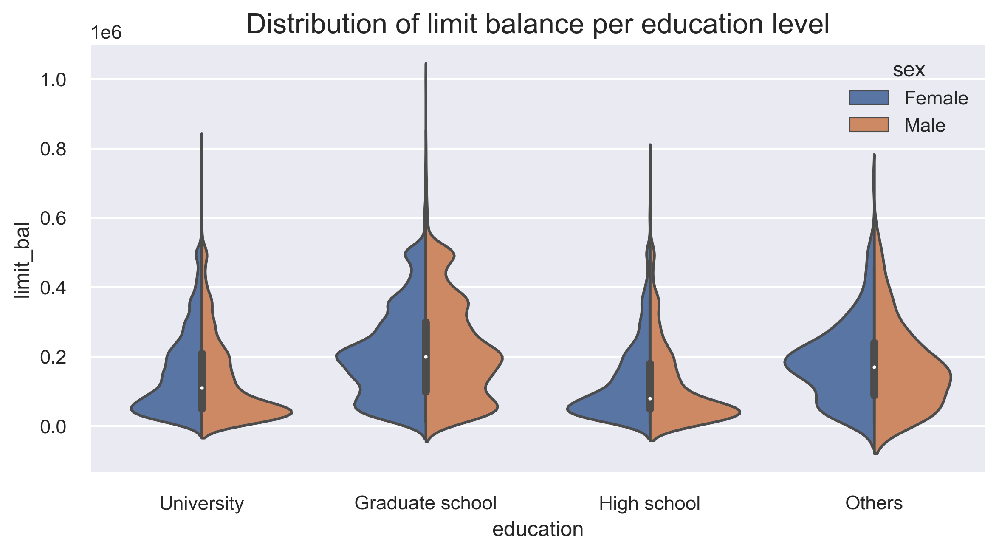

In [20]:
ax = sns.violinplot(x='education', y='limit_bal', hue='sex', split=True, data=df)
ax.set_title('Distribution of limit balance per education level',fontsize=16)

plt.tight_layout()
plt.show()

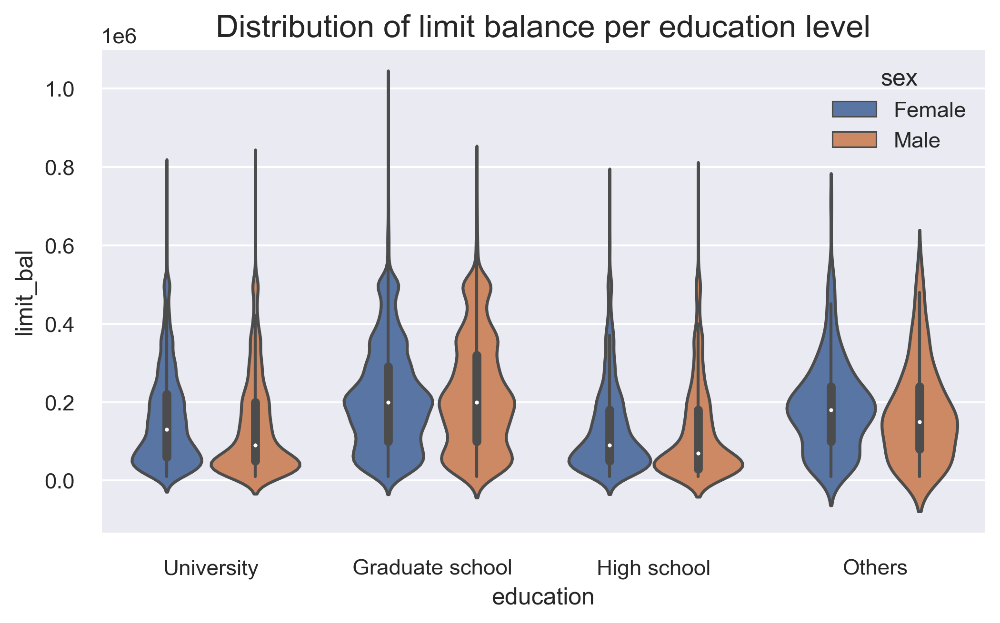

In [21]:
ax = sns.violinplot(x='education', y='limit_bal', hue='sex', data=df)
ax.set_title('Distribution of limit balance per education level',fontsize=16);

Kommentar: 

    Nach Recherchen wurden einige Muster gefunden:

- die höchste "Balance_lim" gehört zu der Gruppe mit "Graduate School";
- Die Form der Verteilung hängt vom Bildungsgrad ab, z. B. ähnelt die Kategorie "Others" der Kategorie "Graduate School"; 
- Im Allgemeinen gibt es keinen Unterschied zwischen dem Geschlecht der Kreditnehmer;


1.2.8 Untersuchen die Verteilung der Zielvariablen nach Geschlecht und Bildungsgrad:

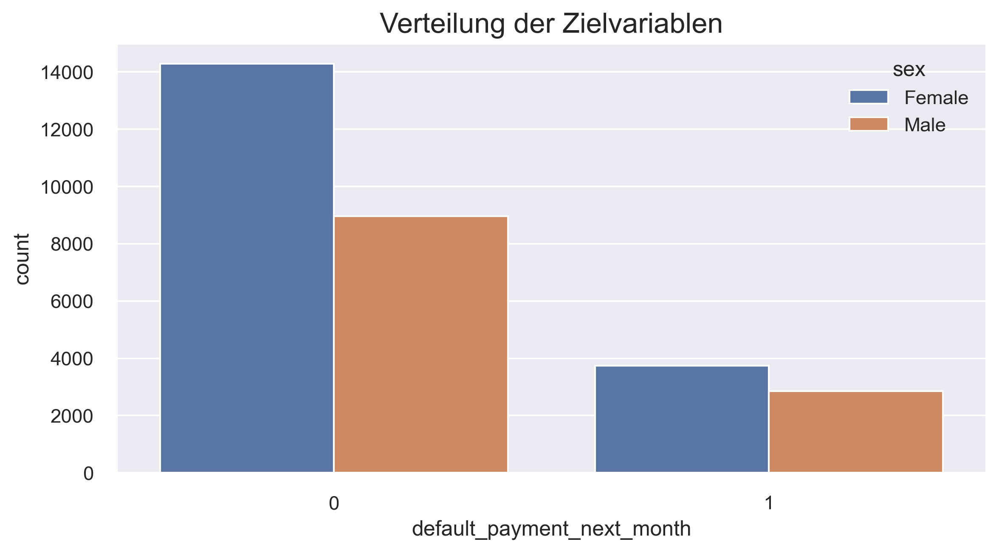

In [22]:
ax = sns.countplot('default_payment_next_month', hue='sex', data=df, orient='h')
ax.set_title('Verteilung der Zielvariablen', fontsize=16)

plt.tight_layout()
plt.show()

Kommentar:

    - Aus der Studie geht hervor, dass der höchste Prozentsatz an Zahlungsausfällen bei männlichen Kunden zu verzeichnen ist.

1.2.9 Untersuchung des Prozentsatzes der Zahlungsausfälle nach Bildungsstand:

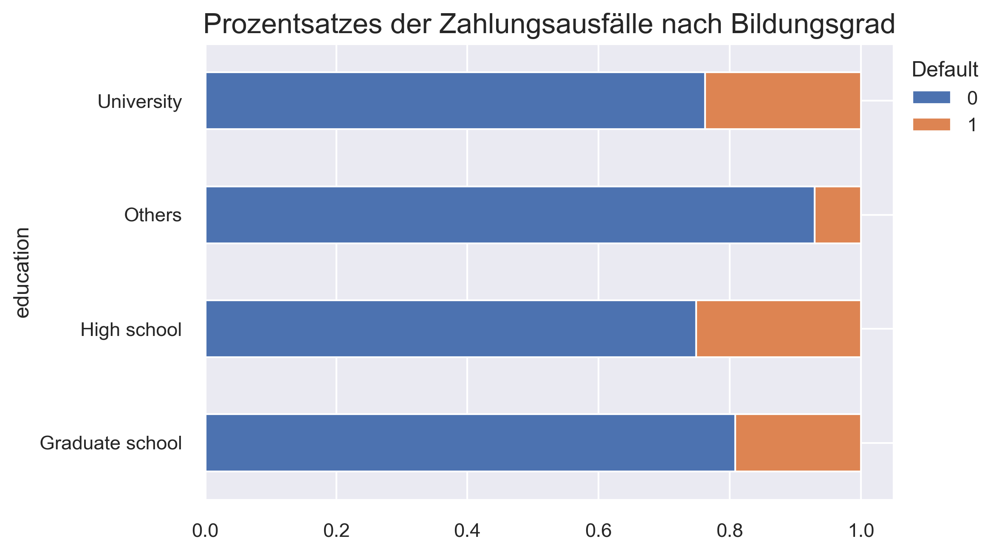

In [23]:
ax = df.groupby('education')['default_payment_next_month'] \
       .value_counts(normalize=True) \
       .unstack() \
       .plot(kind='barh', stacked='True')
ax.set_title('Prozentsatzes der Zahlungsausfälle nach Bildungsgrad', 
             fontsize=16)
ax.legend(title='Default', bbox_to_anchor=(1,1)) 

plt.tight_layout()
plt.show()

Kommentar:

    - Auf der Grundlage von Untersuchungen kann man sagen, dass Zahlungsausfälle häufiger bei Kunden mit "High school" 
    und seltener bei Kunden aus die Kategorie "Sonstige" auftreten

## Aufteilung der Daten in einen Trainings- und einen Testsatz

1.3.1 Import the function from `sklearn`:

In [121]:
from sklearn.model_selection import train_test_split

1.3.2 Split the data into training and test sets:

In [122]:
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

1.3.3 Split the data into training and test sets without shuffling:

In [123]:
#X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=0.2, shuffle=False)

1.3.4 Split the data into training and test sets with stratification:

In [124]:
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.2, 
                                                    stratify=y, 
                                                    random_state=42)

Kommentar: 

20  % - TestSet, 80 % - TrainSet

"stratify=y" - Random split für unausgeglichene Daten


1.3.5 Verify that the ratio of the target is preserved:

In [178]:
y_train.value_counts(normalize=True)

0    0.778792
1    0.221208
Name: default_payment_next_month, dtype: float64

In [179]:
y_test.value_counts(normalize=True)

0    0.778833
1    0.221167
Name: default_payment_next_month, dtype: float64

Kommentar: in beiden Stichproben liegt die Kreditausfallquote bei etwa 22,12 %

##  Aufteilung der Daten in Trainings-, Validierungs- und Testsätze zur Evaluierung und Abstimmung der Hypoparameter des Modells:

In [30]:
# define the size of the validation and test sets
VALID_SIZE = 0.1
TEST_SIZE = 0.2

# create the initial split - training and temp
X_train, X_temp, y_train, y_temp = train_test_split(X, y, 
                                                     test_size=(VALID_SIZE + TEST_SIZE), 
                                                    stratify=y, 
                                                    random_state=42)

# calculate the new test size
NEW_TEST_SIZE = np.around(TEST_SIZE / (VALID_SIZE + TEST_SIZE), 2)

# create the valid and test sets
X_valid, X_test, y_valid, y_test = train_test_split(X_temp, y_temp, 
                                                     test_size=NEW_TEST_SIZE, 
                                                     stratify=y_temp, 
                                                     random_state=42)

## Umgang mit fehlenden Werten

1.5.1 Import the libraries:

In [31]:
import pandas as pd 
import missingno  # conda install -c conda-forge missingno
from sklearn.impute import SimpleImputer

1.5.2 Inspect the information about the DataFrame:

In [32]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30000 entries, 0 to 29999
Data columns (total 23 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   limit_bal             30000 non-null  int64  
 1   sex                   29850 non-null  object 
 2   education             29850 non-null  object 
 3   marriage              29850 non-null  object 
 4   age                   29850 non-null  float64
 5   payment_status_sep    30000 non-null  object 
 6   payment_status_aug    30000 non-null  object 
 7   payment_status_jul    30000 non-null  object 
 8   payment_status_jun    30000 non-null  object 
 9   payment_status_may    30000 non-null  object 
 10  payment_status_apr    30000 non-null  object 
 11  bill_statement_sep    30000 non-null  int64  
 12  bill_statement_aug    30000 non-null  int64  
 13  bill_statement_jul    30000 non-null  int64  
 14  bill_statement_jun    30000 non-null  int64  
 15  bill_statement_may 

1.5.3 Visualize the nullity of the DataFrame:

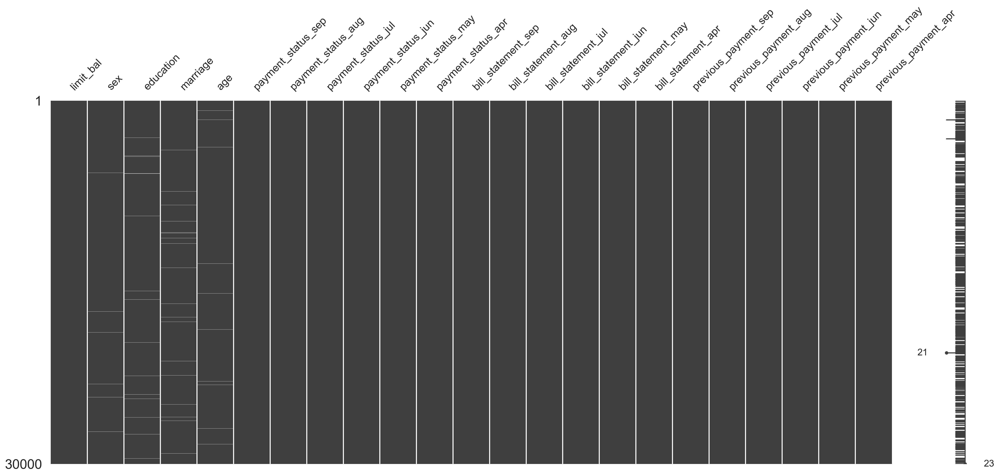

In [127]:
missingno.matrix(X)

plt.show()

Kommentar: Weiße Balken in den Datenspalten informieren uns über fehlende Werte in den 23 Spalten und Zeilen mit fehlenden Werten.

1.5.4. Define columns with missing values per data type:

In [128]:
NUM_FEATURES = ['age']
CAT_FEATURES = ['sex', 'education', 'marriage']

5. Impute the numerical feature:

In [129]:
for col in NUM_FEATURES:
    num_imputer = SimpleImputer(strategy='median')
    num_imputer.fit(X_train[[col]])
    X_train.loc[:, col] = num_imputer.transform(X_train[[col]])
    X_test.loc[:, col] = num_imputer.transform(X_test[[col]])

Verwenden den SimpleImputer (strategy='median'), um fehlende Werte  in Spalte ['age'] aufzufüllen

1.5.6. Impute the categorical features:

In [130]:
for col in CAT_FEATURES:
    cat_imputer = SimpleImputer(strategy='most_frequent')
    cat_imputer.fit(X_train[[col]])
    X_train.loc[:, col] = cat_imputer.transform(X_train[[col]])
    X_test.loc[:, col] = cat_imputer.transform(X_test[[col]])

Verwenden den SimpleImputer (strategy='most_frequent') um fehlende Werte in Spalten ['sex', 'education', 'marriage'] aufzufüllen

1.5.7. Verify that there are no missing values:

In [37]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20999 entries, 25553 to 27126
Data columns (total 23 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   limit_bal             20999 non-null  int64  
 1   sex                   20999 non-null  object 
 2   education             20999 non-null  object 
 3   marriage              20999 non-null  object 
 4   age                   20999 non-null  float64
 5   payment_status_sep    20999 non-null  object 
 6   payment_status_aug    20999 non-null  object 
 7   payment_status_jul    20999 non-null  object 
 8   payment_status_jun    20999 non-null  object 
 9   payment_status_may    20999 non-null  object 
 10  payment_status_apr    20999 non-null  object 
 11  bill_statement_sep    20999 non-null  int64  
 12  bill_statement_aug    20999 non-null  int64  
 13  bill_statement_jul    20999 non-null  int64  
 14  bill_statement_jun    20999 non-null  int64  
 15  bill_statement_

## Enkodierung kategorialer Variablen

1.6.1. Import the libraries:

In [131]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.compose import ColumnTransformer

3. Select categorical features for one-hot encoding:

In [132]:
CAT_FEATURES = X_train.select_dtypes(include='object') \
                      .columns \
                      .to_list()

4. Instantiate the One-Hot Encoder object:

In [133]:
one_hot_encoder = OneHotEncoder(sparse=False, 
                                handle_unknown='error', 
                                drop='first')

5. Create the column transformer using the one-hot encoder: 

In [134]:
one_hot_transformer = ColumnTransformer(
    [("one_hot", one_hot_encoder, CAT_FEATURES)]
    #,remainder='passthrough'
)

6. Fit the transformer:

In [135]:
one_hot_transformer.fit(X_train)

ColumnTransformer(transformers=[('one_hot',
                                 OneHotEncoder(drop='first', sparse=False),
                                 ['sex', 'education', 'marriage',
                                  'payment_status_sep', 'payment_status_aug',
                                  'payment_status_jul', 'payment_status_jun',
                                  'payment_status_may',
                                  'payment_status_apr'])])

7. Apply the transformations to both training and test sets:

In [136]:
col_names = one_hot_transformer.get_feature_names()

X_train_cat = pd.DataFrame(one_hot_transformer.transform(X_train), 
                           columns=col_names, 
                           index=X_train.index)
X_train_ohe = pd.concat([X_train, X_train_cat], axis=1) \
                .drop(CAT_FEATURES, axis=1)

X_test_cat = pd.DataFrame(one_hot_transformer.transform(X_test), 
                          columns=col_names, 
                          index=X_test.index)
X_test_ohe = pd.concat([X_test, X_test_cat], axis=1) \
               .drop(CAT_FEATURES, axis=1)

In [137]:
X_test_cat

,one_hot__x0_Male,one_hot__x1_High school,one_hot__x1_Others,one_hot__x1_University,one_hot__x2_Others,one_hot__x2_Single,one_hot__x3_Payment delayed 1 month,one_hot__x3_Payment delayed 2 months,one_hot__x3_Payment delayed 3 months,one_hot__x3_Payment delayed 4 months,...,one_hot__x7_Payment delayed 8 months,one_hot__x7_Unknown,one_hot__x8_Payment delayed 2 months,one_hot__x8_Payment delayed 3 months,one_hot__x8_Payment delayed 4 months,one_hot__x8_Payment delayed 5 months,one_hot__x8_Payment delayed 6 months,one_hot__x8_Payment delayed 7 months,one_hot__x8_Payment delayed 8 months,one_hot__x8_Unknown
6907,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
24575,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
26766,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2156,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3179,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8836,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1259,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
27309,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
29583,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [138]:
X_test_ohe

,limit_bal,age,bill_statement_sep,bill_statement_aug,bill_statement_jul,bill_statement_jun,bill_statement_may,bill_statement_apr,previous_payment_sep,previous_payment_aug,...,one_hot__x7_Payment delayed 8 months,one_hot__x7_Unknown,one_hot__x8_Payment delayed 2 months,one_hot__x8_Payment delayed 3 months,one_hot__x8_Payment delayed 4 months,one_hot__x8_Payment delayed 5 months,one_hot__x8_Payment delayed 6 months,one_hot__x8_Payment delayed 7 months,one_hot__x8_Payment delayed 8 months,one_hot__x8_Unknown
6907,50000,46.0,1540,26060,0,2650,3320,2764,26060,0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
24575,150000,31.0,15000,0,0,0,0,11694,0,0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
26766,50000,25.0,48065,48355,49009,49949,50479,50702,1800,1844,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2156,290000,25.0,305823,303701,296384,248801,241983,230925,15000,10500,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3179,500000,27.0,11354,9983,13570,10000,10000,10000,9983,13587,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8836,150000,27.0,12178,22344,65330,20333,8433,10332,22452,65676,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1259,50000,24.0,49946,48808,45469,20228,18900,19066,0,2079,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
27309,220000,34.0,14588,6689,4664,9530,118206,112206,5021,4674,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
29583,120000,26.0,2382,884,0,0,10446,0,884,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Anpassung eines Entscheidungsbaum-Klassifikators / Decision tree classifier

1. Import the libraries:

In [139]:
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn import metrics

from performance import performance_evaluation_report

from io import StringIO
import seaborn as sns
from ipywidgets import Image

import pydotplus # conda install -c conda-forge pydotplus



2. Create the instance of the model, fit it to the training data and create prediction:

In [180]:
tree_classifier = DecisionTreeClassifier(random_state=42)
tree_classifier.fit(X_train_ohe, y_train)
y_pred = tree_classifier.predict(X_test_ohe)

3. Evaluate the results:

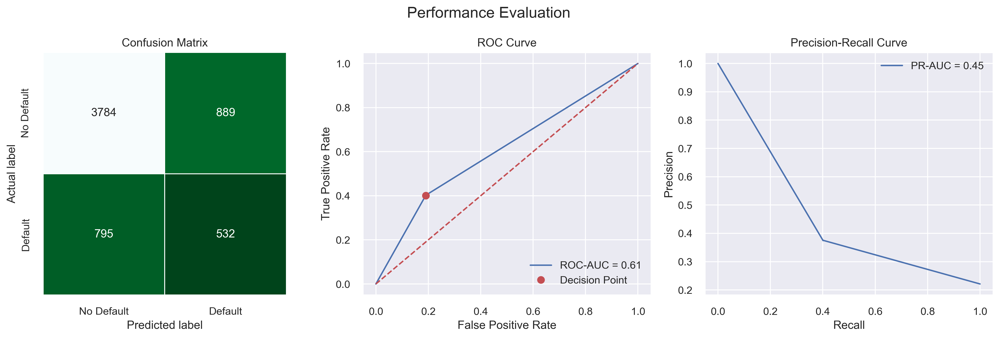

In [182]:
LABELS = ['No Default', 'Default']
tree_perf = performance_evaluation_report(tree_classifier, 
                                          X_test_ohe, 
                                          y_test, labels=LABELS, 
                                          show_plot=True,
                                          show_pr_curve = True)

plt.tight_layout()
plt.show()

Bewertung unseres Algorithmus und Modells

In [183]:
tree_perf

{'accuracy': 0.7193333333333334,
 'precision': 0.37438423645320196,
 'recall': 0.400904295403165,
 'specificity': 0.8097581853199229,
 'f1_score': 0.38719068413391555,
 'cohens_kappa': 0.20545212086249653,
 'roc_auc': 0.6059202515178426,
 'pr_auc': 0.4542470275794692}

4. Plot the simplified Decision Tree:

In [199]:
small_tree = DecisionTreeClassifier(max_depth=5, 
                                    random_state=42)
small_tree.fit(X_train_ohe, y_train)

tree_dot = StringIO()
export_graphviz(small_tree, feature_names=X_train_ohe.columns,
                class_names=LABELS, rounded=True, out_file=tree_dot,
                proportion=False, precision=2, filled=True)
tree_graph = pydotplus.graph_from_dot_data(tree_dot.getvalue())  
tree_graph.set_dpi(300) 
Image(value=tree_graph.create_png())

Image(value=b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00J\'\x00\x00\n\xec\x08\x06\x00\x00\x00g\x1b\xa1g\x00\x…

## Anpassung eines Ensemble-StackingClassifier:
  ### Ensemble: DecisionTree-LogisticRegression-KNeighborsClassifier-GaussianNB

In [144]:
import pandas as pd
from sklearn.model_selection import (train_test_split,
                                     StratifiedKFold)
from sklearn import metrics
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from performance import performance_evaluation_report
#from sklearn.pipeline import Pipeline

In [145]:
RANDOM_STATE = 42

k_fold = StratifiedKFold(5, shuffle=True, random_state=42)

scaler = StandardScaler()
#scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train_ohe)
X_test = scaler.transform(X_test_ohe)

#X_train = X_train_ohe  #scaler.fit_transform(X_train_ohe)
#X_test = X_test_ohe #scaler.transform(X_test_ohe)

In [146]:
clf_list = [('dec_tree', DecisionTreeClassifier(random_state=RANDOM_STATE)),
            ('log_reg', LogisticRegression()),
            ('knn', KNeighborsClassifier()),
            ('naive_bayes', GaussianNB())]

In [147]:
for model_tuple in clf_list:
    model = model_tuple[1]
    if 'random_state' in model.get_params().keys():
        model.set_params(random_state=RANDOM_STATE)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    recall = metrics.recall_score(y_pred, y_test)
    print(f"{model_tuple[0]}'s recall score: {recall:.4f}")

dec_tree's recall score: 0.3753
log_reg's recall score: 0.6629
knn's recall score: 0.5590
naive_bayes's recall score: 0.6339


In [148]:
lr = LogisticRegression()
stack_clf = StackingClassifier(clf_list, 
                               final_estimator=lr,
                               cv=k_fold,
                               n_jobs=-1)
stack_clf.fit(X_train, y_train)

StackingClassifier(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
                   estimators=[('dec_tree',
                                DecisionTreeClassifier(random_state=42)),
                               ('log_reg', LogisticRegression(random_state=42)),
                               ('knn', KNeighborsClassifier()),
                               ('naive_bayes', GaussianNB())],
                   final_estimator=LogisticRegression(), n_jobs=-1)

In [149]:
y_pred = stack_clf.predict(X_test)
recall = metrics.recall_score(y_pred, y_test)
print(f"The stacked ensemble's recall score: {recall:.4f}")

The stacked ensemble's recall score: 0.6681


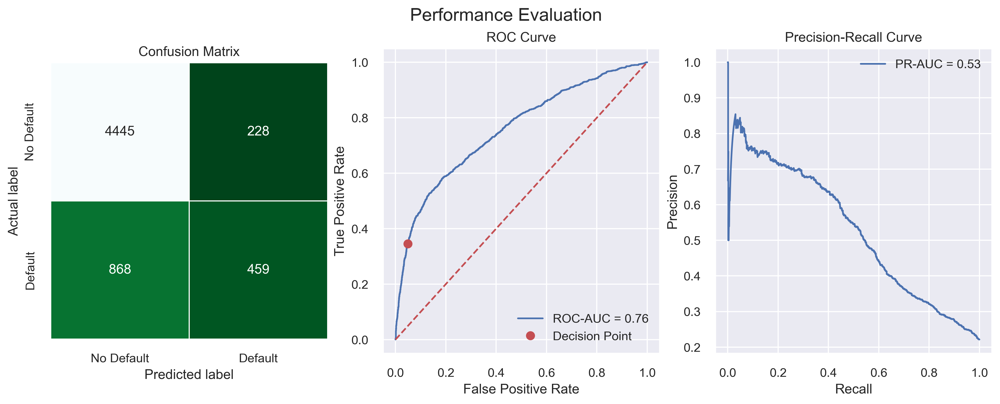

In [150]:
stack_clf_perf = performance_evaluation_report(stack_clf, X_test, 
                                             y_test, labels=LABELS, 
                                             show_plot=True,
                                             show_pr_curve=True)

In [156]:
stack_clf_perf

{'accuracy': 0.8173333333333334,
 'precision': 0.6681222707423581,
 'recall': 0.3458929917106255,
 'specificity': 0.9512090734003852,
 'f1_score': 0.45580933465739826,
 'cohens_kappa': 0.35910817797846584,
 'roc_auc': 0.7559731214172519,
 'pr_auc': 0.5254897277576952}

## Anpassung eines RandomForest-Klassifikators für imbalancierten Daten (Oversampling - Undersampling)
  ### mittels BalancedRandomForestClassifier, SMOTE und ADASYN (ADASYN ist eine verallgemeinerte Form des SMOTE-Algorithmus )

In [151]:
import pandas as pd
import seaborn as sns
from imblearn.over_sampling import RandomOverSampler, SMOTE, ADASYN  # conda install -c conda-forge imbalanced-learn
from imblearn.under_sampling import RandomUnderSampler # conda install -c conda-forge imbalanced-learn
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from collections import Counter
from performance import performance_evaluation_report

In [152]:
y.value_counts(normalize=True)

0    0.7788
1    0.2212
Name: default_payment_next_month, dtype: float64

In [153]:
rf = RandomForestClassifier(random_state=RANDOM_STATE, n_jobs=-1)
rf.fit(X_train_ohe, y_train)

RandomForestClassifier(n_jobs=-1, random_state=42)

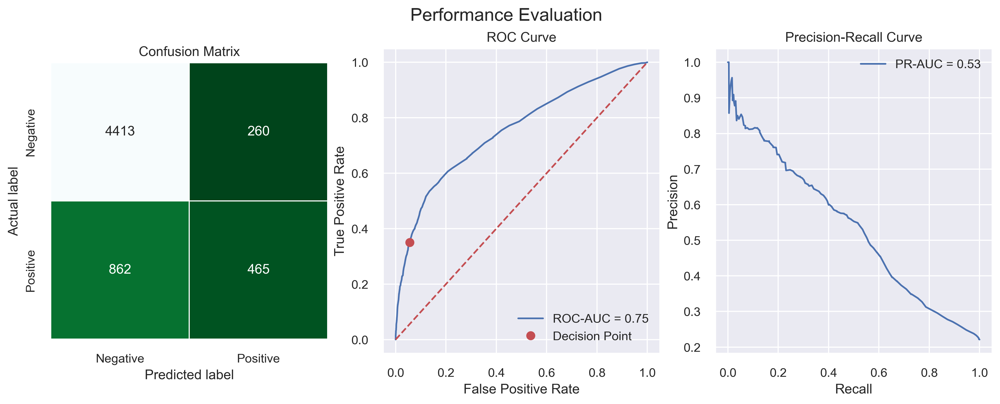

In [154]:
rf_perf = performance_evaluation_report(rf, X_test_ohe, y_test, 
                                        show_plot=True, 
                                        show_pr_curve=True)

In [155]:
rf_perf

{'accuracy': 0.813,
 'precision': 0.6413793103448275,
 'recall': 0.35041446872645066,
 'specificity': 0.9443612240530709,
 'f1_score': 0.45321637426900585,
 'cohens_kappa': 0.351935193519352,
 'roc_auc': 0.7531513507908553,
 'pr_auc': 0.5346314538605785}

### Undersample the data and train a Random Forest Classifier:

The new class proportions are: {0: 5309, 1: 5309}


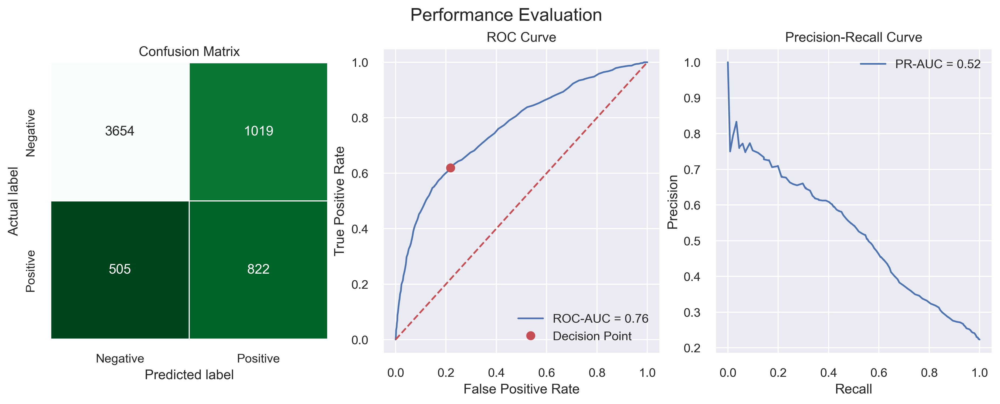

In [159]:
rus = RandomUnderSampler(random_state=RANDOM_STATE)
X_rus, y_rus = rus.fit_resample(X_train_ohe, y_train)
print(f'The new class proportions are: {dict(Counter(y_rus))}')

rf.fit(X_rus, y_rus)
rf_rus_perf = performance_evaluation_report(rf, X_test_ohe, y_test, 
                                            show_plot=True, 
                                            show_pr_curve=True)

In [160]:
rf_rus_perf

{'accuracy': 0.746,
 'precision': 0.4464964693101575,
 'recall': 0.6194423511680482,
 'specificity': 0.7819387973464583,
 'f1_score': 0.5189393939393939,
 'cohens_kappa': 0.3524990040352681,
 'roc_auc': 0.7613026040179189,
 'pr_auc': 0.5208692474960201}

### Oversample the data and train a Random Forest Classifier:

The new class proportions are: {0: 18691, 1: 18691}


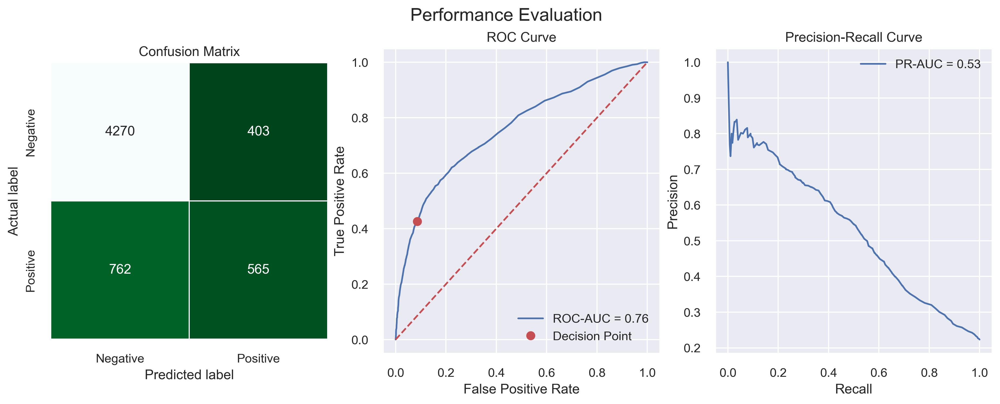

In [161]:
ros = RandomOverSampler(random_state=RANDOM_STATE)
X_ros, y_ros = ros.fit_resample(X_train_ohe, y_train)
print(f'The new class proportions are: {dict(Counter(y_ros))}')

rf.fit(X_ros, y_ros)
rf_ros_perf = performance_evaluation_report(rf, X_test_ohe, y_test, 
                                            show_plot=True, 
                                            show_pr_curve=True)

In [162]:
rf_ros_perf

{'accuracy': 0.8058333333333333,
 'precision': 0.5836776859504132,
 'recall': 0.42577241899020346,
 'specificity': 0.9137598972822598,
 'f1_score': 0.49237472766884527,
 'cohens_kappa': 0.37594456459321945,
 'roc_auc': 0.755885475267095,
 'pr_auc': 0.526641779935374}

### Oversample using SMOTE:

The new class proportions are: {0: 18691, 1: 18691}


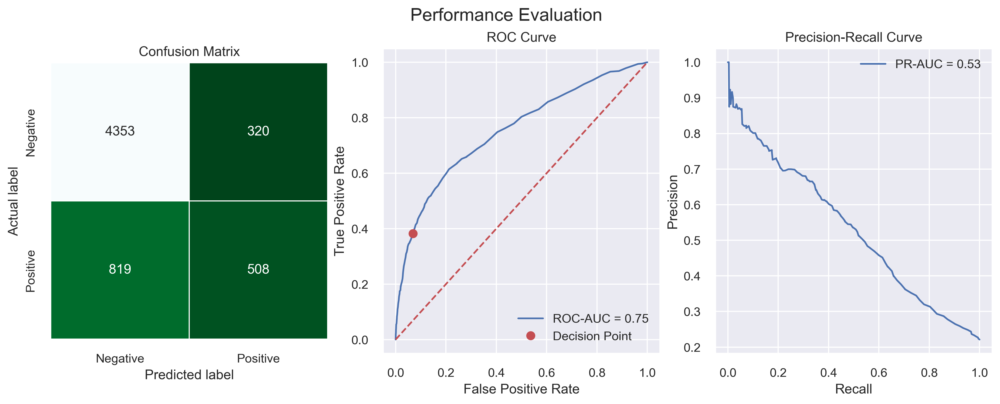

In [163]:
X_smote, y_smote = SMOTE(random_state=RANDOM_STATE).fit_resample(X_train_ohe, y_train)
print(f'The new class proportions are: {dict(Counter(y_smote))}')
rf.fit(X_smote, y_smote)
rf_smote_perf = performance_evaluation_report(rf, X_test_ohe, y_test, 
                                              show_plot=True, 
                                              show_pr_curve=True)

In [164]:
rf_smote_perf

{'accuracy': 0.8101666666666667,
 'precision': 0.6135265700483091,
 'recall': 0.38281838733986434,
 'specificity': 0.9315215065268564,
 'f1_score': 0.4714617169373549,
 'cohens_kappa': 0.36324177581190864,
 'roc_auc': 0.7524079308235626,
 'pr_auc': 0.5306677739830754}

### Oversample using ADASYN:

The new class proportions are: {0: 18691, 1: 19246}


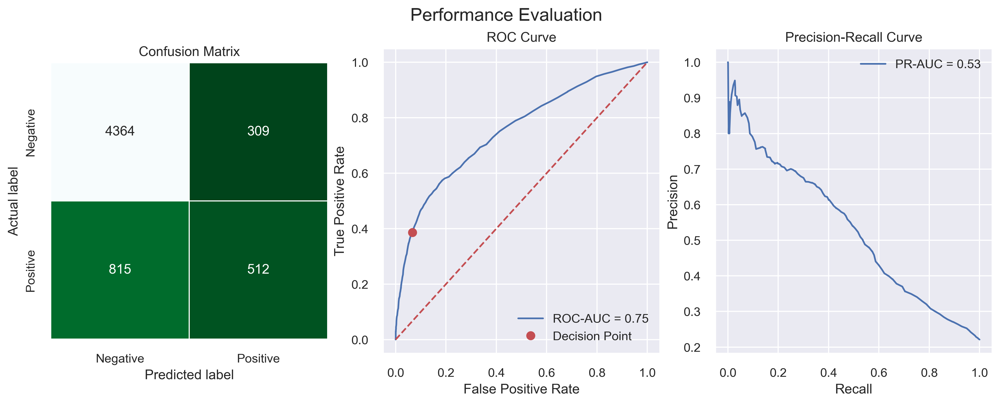

In [166]:
X_adasyn, y_adasyn = ADASYN(random_state=RANDOM_STATE).fit_resample(X_train_ohe, y_train)
print(f'The new class proportions are: {dict(Counter(y_adasyn))}')
rf.fit(X_adasyn, y_adasyn)
rf_adasyn_perf = performance_evaluation_report(rf, X_test_ohe, y_test, 
                                               show_plot=True, 
                                               show_pr_curve=True)

In [167]:
rf_adasyn_perf

{'accuracy': 0.8126666666666666,
 'precision': 0.6236297198538368,
 'recall': 0.3858327053504145,
 'specificity': 0.9338754547399957,
 'f1_score': 0.4767225325884543,
 'cohens_kappa': 0.37025320415431195,
 'roc_auc': 0.7510607441843514,
 'pr_auc': 0.5288956224554586}

### Use sample weights in the Random Forest Classifier:

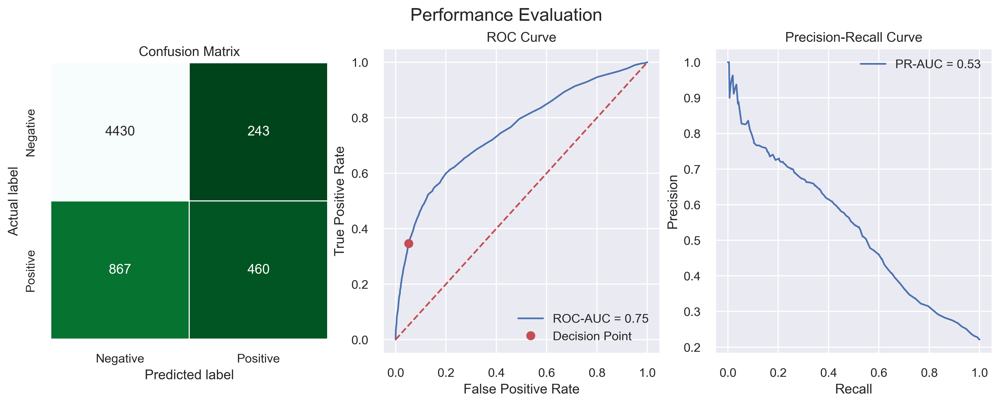

In [168]:
rf_cw = RandomForestClassifier(random_state=RANDOM_STATE, 
                               class_weight='balanced',
                               n_jobs=-1)
rf_cw.fit(X_train_ohe, y_train)
rf_cw_perf = performance_evaluation_report(rf_cw, X_test_ohe, y_test, 
                                           show_plot=True, 
                                           show_pr_curve=True)

In [169]:
rf_cw_perf

{'accuracy': 0.815,
 'precision': 0.6543385490753911,
 'recall': 0.346646571213263,
 'specificity': 0.9479991440188316,
 'f1_score': 0.4532019704433497,
 'cohens_kappa': 0.3542906417323315,
 'roc_auc': 0.7526559524959479,
 'pr_auc': 0.5335040052024946}

### Train the BalancedRandomForestClassifier:

In [172]:
from imblearn.ensemble import BalancedRandomForestClassifier

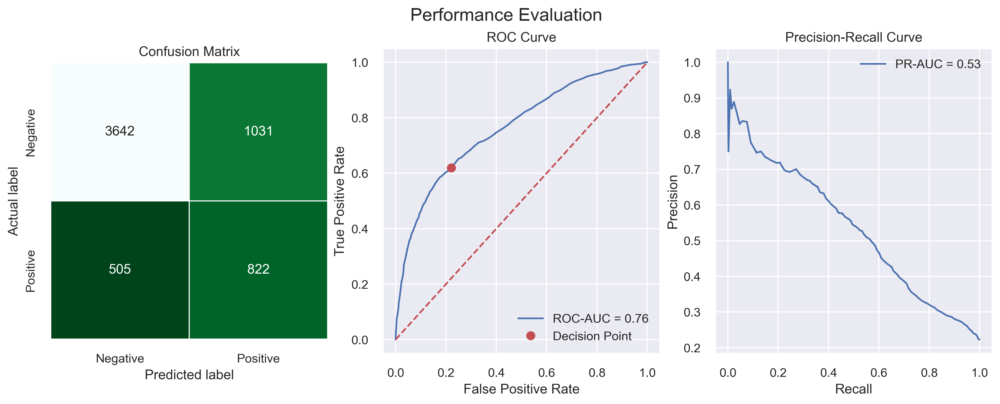

In [173]:
balanced_rf = BalancedRandomForestClassifier(
    random_state=RANDOM_STATE
)

balanced_rf.fit(X_train_ohe, y_train)
balanced_rf_perf = performance_evaluation_report(balanced_rf, 
                                                 X_test_ohe, y_test, 
                                                 show_plot=True, 
                                                 show_pr_curve=True)


In [174]:
balanced_rf_perf

{'accuracy': 0.744,
 'precision': 0.4436049649217485,
 'recall': 0.6194423511680482,
 'specificity': 0.7793708538412155,
 'f1_score': 0.5169811320754718,
 'cohens_kappa': 0.3492507981492624,
 'roc_auc': 0.7638698218420656,
 'pr_auc': 0.5334272891290391}

### Train the BalancedRandomForestClassifier with balanced classes:

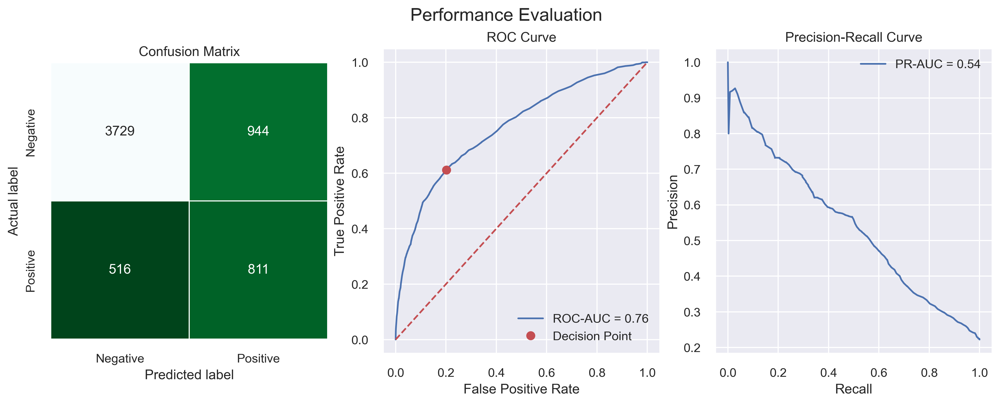

In [175]:
balanced_rf_cw = BalancedRandomForestClassifier(
    random_state=RANDOM_STATE, 
    class_weight='balanced',
    n_jobs=-1
)

balanced_rf_cw.fit(X_train_ohe, y_train)
balanced_rf_cw_perf = performance_evaluation_report(balanced_rf_cw, 
                                                    X_test_ohe, y_test, 
                                                    show_plot=True, 
                                                    show_pr_curve=True)


In [176]:
balanced_rf_cw_perf

{'accuracy': 0.7566666666666667,
 'precision': 0.4621082621082621,
 'recall': 0.6111529766390355,
 'specificity': 0.7979884442542264,
 'f1_score': 0.5262816353017522,
 'cohens_kappa': 0.3667880322938103,
 'roc_auc': 0.7644640740285025,
 'pr_auc': 0.5408843641248839}

In [198]:
performance_results1 = {'random_forest': rf_perf,
                       'undersampled rf': rf_rus_perf,
                       'oversampled_rf': rf_ros_perf,
                       'smote': rf_smote_perf,
                       'adasyn': rf_adasyn_perf,
                       'random_forest_cw': rf_cw_perf,
                       'balanced_random_forest': balanced_rf_perf,
                       'balanced_random_forest_cw': balanced_rf_cw_perf,
                       'Bayesian Hyperparameter Optimization': best_lgbm_perf}
pd.DataFrame(performance_results1).T

,accuracy,precision,recall,specificity,f1_score,cohens_kappa,roc_auc,pr_auc
random_forest,0.813000,0.641379,0.350414,0.944361,0.453216,0.351935,0.753151,0.534631
undersampled rf,0.746000,0.446496,0.619442,0.781939,0.518939,0.352499,0.761303,0.520869
oversampled_rf,0.805833,0.583678,0.425772,0.913760,0.492375,0.375945,0.755885,0.526642
smote,0.810167,0.613527,0.382818,0.931522,0.471462,0.363242,0.752408,0.530668
adasyn,0.812667,0.623630,0.385833,0.933875,0.476723,0.370253,0.751061,0.528896
random_forest_cw,0.815000,0.654339,0.346647,0.947999,0.453202,0.354291,0.752656,0.533504
balanced_random_forest,0.744000,0.443605,0.619442,0.779371,0.516981,0.349251,0.763870,0.533427
balanced_random_forest_cw,0.756667,0.462108,0.611153,0.797988,0.526282,0.366788,0.764464,0.540884
Bayesian Hyperparameter Optimization,0.758667,0.466030,0.625471,0.796490,0.534106,0.375917,0.777963,0.541919


###  Bayesian Hyperparameter Optimization

In [185]:
import pandas as pd
import pickle
from sklearn.model_selection import train_test_split
from hyperopt import hp, fmin, tpe, STATUS_OK, Trials
from sklearn.model_selection import (cross_val_score, 
                                     StratifiedKFold)
from lightgbm import LGBMClassifier
from performance import performance_evaluation_report
import pickle

In [186]:
N_FOLDS = 5
MAX_EVALS = 200

In [187]:
def objective(params, n_folds = N_FOLDS, random_state=42):
    
    model = LGBMClassifier(**params)
    model.set_params(random_state=random_state)
    
    k_fold = StratifiedKFold(n_folds, shuffle=True, 
                             random_state=random_state)
    
    metrics = cross_val_score(model, X_train_ohe, y_train, 
                              cv=k_fold, scoring='recall')
    loss = -1 * metrics.mean()
    
    return {'loss': loss, 'params': params, 'status': STATUS_OK}

In [188]:
lgbm_param_grid = {
    'boosting_type': hp.choice('boosting_type', ['gbdt', 'dart', 'goss']),
    'max_depth': hp.choice('max_depth', [-1, 2, 3, 4, 5, 6, 7, 8, 9, 10]),
    'n_estimators': hp.choice('n_estimators', [10, 50, 100, 
                                               300, 750, 1000]),
    'is_unbalance': hp.choice('is_unbalance', [True, False]),
    'colsample_bytree': hp.uniform('colsample_bytree', 0.3, 1),
    'learning_rate': hp.uniform ('learning_rate', 0.05, 0.3),
}

In [189]:
trials = Trials()
best_set = fmin(fn= objective,
                space= lgbm_param_grid,
                algo= tpe.suggest,
                max_evals = MAX_EVALS,
                trials= trials)

100%|██████████| 200/200 [09:35<00:00,  2.88s/trial, best loss: -0.6436260075152072]


In [190]:
# load if already finished the search
#best_set = pickle.load(open('best_set.p', 'rb'))
best_set

{'boosting_type': 2,
 'colsample_bytree': 0.9820766561452442,
 'is_unbalance': 0,
 'learning_rate': 0.10393092992672863,
 'max_depth': 2,
 'n_estimators': 2}

In [191]:
boosting_type = {0: 'gbdt', 1: 'dart', 2: 'goss'}
max_depth = {0: -1, 1: 2, 2: 3, 3: 4, 4: 5, 5: 6, 
             6: 7, 7: 8, 8: 9, 9: 10}
n_estimators = {0: 10, 1: 50, 2: 100, 3: 300, 4: 750, 5: 1000}
is_unbalance = {0: True, 1: False}

In [192]:
lgbm_param_grid = {'boosting_type': hp.choice('boosting_type', ['gbdt', 'dart', 'goss']),
                   'max_depth': hp.choice('max_depth', [-1, 2, 3, 4, 5, 6, 7, 8, 9, 10]),
                   'n_estimators': hp.choice('n_estimators', [10, 50, 100, 300, 750, 1000]),
                   'is_unbalance': hp.choice('is_unbalance', [True, False]),
                   'colsample_bytree': hp.uniform('colsample_bytree', 0.3, 1),
                   'learning_rate': hp.uniform ('learning_rate', 0.05, 0.3),
                  }

In [193]:
best_lgbm = LGBMClassifier(
    boosting_type = boosting_type[best_set['boosting_type']], 
    max_depth = max_depth[best_set['max_depth']], 
    n_estimators = n_estimators[best_set['n_estimators']], 
    is_unbalance = is_unbalance[best_set['is_unbalance']],
    colsample_bytree = best_set['colsample_bytree'], 
    learning_rate = best_set['learning_rate']
)
best_lgbm.fit(X_train_ohe, y_train)

LGBMClassifier(boosting_type='goss', colsample_bytree=0.9820766561452442,
               is_unbalance=True, learning_rate=0.10393092992672863,
               max_depth=3)

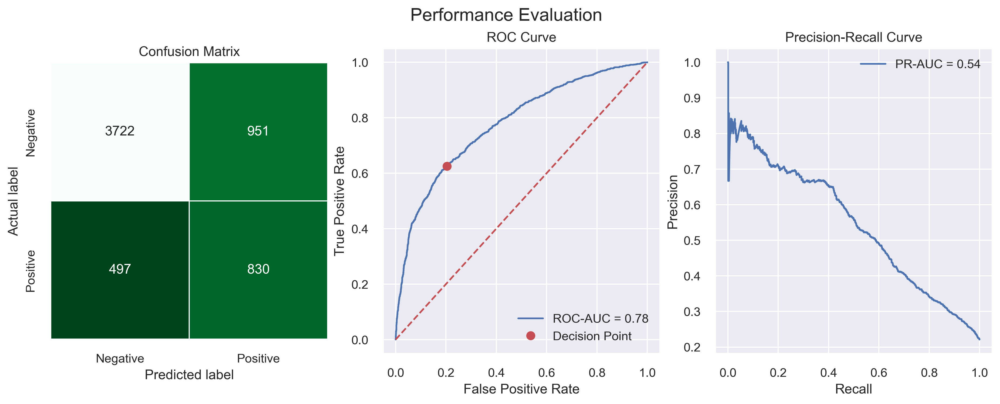

In [195]:
best_lgbm_perf = performance_evaluation_report(best_lgbm, X_test_ohe, y_test, 
                                  show_plot=True, 
                                  show_pr_curve=True)

plt.show()

In [196]:
best_lgbm_perf 

{'accuracy': 0.7586666666666667,
 'precision': 0.46603032004491857,
 'recall': 0.6254709871891485,
 'specificity': 0.7964904772095014,
 'f1_score': 0.5341055341055341,
 'cohens_kappa': 0.3759170348933347,
 'roc_auc': 0.7779632744085658,
 'pr_auc': 0.5419185644746215}

## Implementierung der scikit-learn's Pipeline

1. Import the libraries:

In [52]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.tree import DecisionTreeClassifier
from sklearn.pipeline import Pipeline
from performance import performance_evaluation_report

2. Load the data, separate the target and create the stratified train-test split:

In [53]:
df = pd.read_csv('credit_card_default.csv', 
                 index_col=0, na_values='')

X = df.copy()
y = X.pop('default_payment_next_month')

X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.2, 
                                                    stratify=y, 
                                                    random_state=42)

3. Store lists of numerical/categorical features:

In [54]:
num_features = X_train.select_dtypes(include='number') \
                      .columns \
                      .to_list()
cat_features = X_train.select_dtypes(include='object') \
                      .columns \
                      .to_list()

4. Define the numerical pipeline:

In [55]:
num_pipeline = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median'))
])

5. Define the categorical pipeline:

In [56]:
cat_list = [list(X_train[col].dropna().unique()) for col in cat_features]

cat_pipeline = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(categories=cat_list, sparse=False, 
                             handle_unknown='error', drop='first'))
])

6. Define the column transformer object:

In [57]:
preprocessor = ColumnTransformer(transformers=[
    ('numerical', num_pipeline, num_features),
    ('categorical', cat_pipeline, cat_features)],
    remainder='drop')

7. Create the joint pipeline:

In [58]:
dec_tree = DecisionTreeClassifier(random_state=42)

tree_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                ('classifier', dec_tree)])

8. Fit the pipeline to the data:

In [59]:
tree_pipeline.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('numerical',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median'))]),
                                                  ['limit_bal', 'age',
                                                   'bill_statement_sep',
                                                   'bill_statement_aug',
                                                   'bill_statement_jul',
                                                   'bill_statement_jun',
                                                   'bill_statement_may',
                                                   'bill_statement_apr',
                                                   'previous_payment_sep',
                                                   'previous_payment_aug',
                                                   'previous_pa

9. Evaluate the performance of the entire pipeline:

In [ ]:
LABELS = ['No Default', 'Default']
tree_perf = performance_evaluation_report(tree_pipeline, X_test, 
                                          y_test, labels=LABELS, 
                                          show_plot=True,
                                         show_pr_curve = True)

plt.tight_layout()
plt.show()

Bewertung unseres Algorithmus und Modells

In [61]:
tree_perf

{'accuracy': 0.7233333333333334,
 'precision': 0.3816631130063966,
 'recall': 0.4046721929163527,
 'specificity': 0.8138240958698909,
 'f1_score': 0.3928310168251646,
 'cohens_kappa': 0.21388003714653614,
 'roc_auc': 0.6095279347712678,
 'pr_auc': 0.4589251149708047}

In [62]:
from sklearn.base import BaseEstimator, TransformerMixin

In [63]:
class OutlierRemover(BaseEstimator, TransformerMixin):
    def __init__(self, n_std=3):
        self.n_std = n_std
    
    def fit(self, X, y = None):
        if np.isnan(X).any(axis=None):
            raise ValueError('''There are missing values in the array! 
                                Please remove them.''')

        mean_vec = np.mean(X, axis=0)
        std_vec = np.std(X, axis=0)
        
        self.upper_band_ = mean_vec + self.n_std * std_vec
        self.lower_band_ = mean_vec - self.n_std * std_vec
        self.n_features_ = len(self.upper_band_)
        
        return self 
    
    def transform(self, X, y = None):
        X_copy = pd.DataFrame(X.copy())
        
        upper_band = np.repeat(
            self.upper_band_.reshape(self.n_features_, -1), 
            len(X_copy), 
            axis=1).transpose()
        lower_band = np.repeat(
            self.lower_band_.reshape(self.n_features_, -1), 
            len(X_copy), 
            axis=1).transpose()
        
        X_copy[X_copy >= upper_band] = upper_band
        X_copy[X_copy <= lower_band] = lower_band
        
        return X_copy.values

In [64]:
num_pipeline = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('outliers', OutlierRemover())
])

In [ ]:
preprocessor = ColumnTransformer(transformers=[
    ('numerical', num_pipeline, num_features),
    ('categorical', cat_pipeline, cat_features)],
    remainder='drop')

dec_tree = DecisionTreeClassifier(random_state=42)

tree_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                ('classifier', dec_tree)])

tree_pipeline.fit(X_train, y_train)

tree_perf = performance_evaluation_report(tree_pipeline, X_test, 
                                          y_test, labels=LABELS, 
                                          show_plot=True,
                                         show_pr_curve = True)

plt.tight_layout()
plt.show()

_

Bewertung unseres Algorithmus und Modells

In [66]:
tree_perf

{'accuracy': 0.7203333333333334,
 'precision': 0.377529658060014,
 'recall': 0.4076865109269028,
 'specificity': 0.8091161994436122,
 'f1_score': 0.39202898550724635,
 'cohens_kappa': 0.21077497538963086,
 'roc_auc': 0.608982787005664,
 'pr_auc': 0.4582134167657523}

##  Verfeinerung von Hyperparametern (Tuning hyperparameters) mittels grid search und cross-validation

1. Import the libraries:

In [67]:
from sklearn.model_selection import (GridSearchCV, cross_val_score,RandomizedSearchCV, cross_validate,StratifiedKFold)
from sklearn import metrics

2. Define the cross-validation scheme:

In [68]:
k_fold = StratifiedKFold(5, shuffle=True, random_state=42)

3. Evaluate the pipeline using cross-validation:

In [69]:
cross_val_score(tree_pipeline, X_train, y_train, cv=k_fold)

array([0.72333333, 0.72958333, 0.71375   , 0.723125  , 0.72      ])

4. Add extra metrics to cross-validation:

In [70]:
cross_validate(tree_pipeline, X_train, y_train, cv=k_fold, 
               scoring=['accuracy', 'precision', 'recall', 
                        'roc_auc'])

{'fit_time': array([0.40790272, 0.42912531, 0.41360974, 0.40620208, 0.4146595 ]),
 'score_time': array([0.04928374, 0.05789733, 0.05372834, 0.0586493 , 0.0519464 ]),
 'test_accuracy': array([0.72333333, 0.72958333, 0.71375   , 0.723125  , 0.72      ]),
 'test_precision': array([0.38560411, 0.39557522, 0.36978297, 0.38638298, 0.37674825]),
 'test_recall': array([0.42412818, 0.42090395, 0.41713748, 0.42749529, 0.40583804]),
 'test_roc_auc': array([0.61633282, 0.61893804, 0.60794039, 0.61806569, 0.60712913])}

5. Define the parameter grid:

In [71]:
param_grid = {'classifier__criterion': ['entropy', 'gini'],
              'classifier__max_depth': range(3, 11),
              'classifier__min_samples_leaf': range(2, 11), 
              'preprocessor__numerical__outliers__n_std': [3, 4]}

6. Run Grid Search:

In [72]:
classifier_gs = GridSearchCV(tree_pipeline, param_grid, scoring='recall', 
                             cv=k_fold, n_jobs=-1, verbose=1)

classifier_gs.fit(X_train, y_train)

Fitting 5 folds for each of 288 candidates, totalling 1440 fits


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('numerical',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(strategy='median')),
                                                                                         ('outliers',
                                                                                          OutlierRemover())]),
                                                                         ['limit_bal',
                                                                          'age',
                                                                          'bill_statement_sep',
                                                                          'bill

In [73]:
print(f'Best parameters: {classifier_gs.best_params_}') 
print(f'Recall (Training set): {classifier_gs.best_score_:.4f}') 
print(f'Recall (Test set): {metrics.recall_score(y_test, classifier_gs.predict(X_test)):.4f}')

Best parameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 10, 'classifier__min_samples_leaf': 7, 'preprocessor__numerical__outliers__n_std': 4}
Recall (Training set): 0.3858
Recall (Test set): 0.3775


7. Evaluate the performance of the Grid Search:

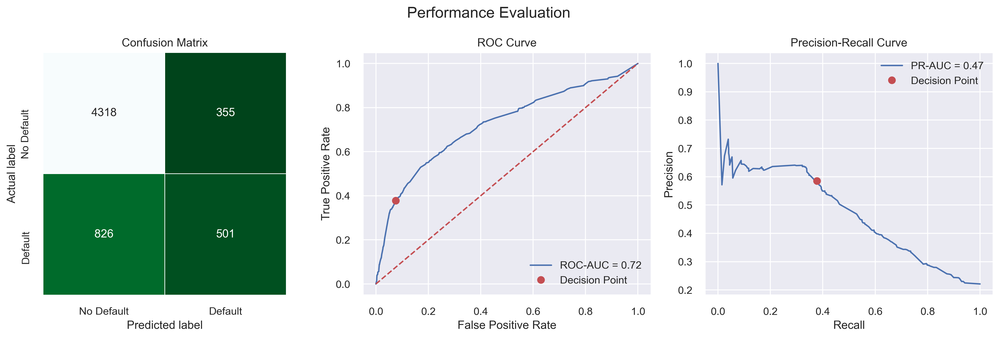

In [108]:
LABELS = ['No Default', 'Default']
tree_gs_perf = performance_evaluation_report(classifier_gs, X_test, 
                                             y_test, labels=LABELS, 
                                             show_plot=True,
                                            show_pr_curve = True)

plt.tight_layout()
plt.show()

Bewertung unseres Algorithmus und Modells

In [75]:
tree_gs_perf

{'accuracy': 0.8031666666666667,
 'precision': 0.5852803738317757,
 'recall': 0.3775433308214017,
 'specificity': 0.9240316713032314,
 'f1_score': 0.45900137425561155,
 'cohens_kappa': 0.34547526291831954,
 'roc_auc': 0.7205480311384921,
 'pr_auc': 0.4698784893189859}

8. Run Randomized Grid Search:

In [76]:
classifier_rs = RandomizedSearchCV(tree_pipeline, param_grid, scoring='recall', 
                                   cv=k_fold, n_jobs=-1, verbose=1, 
                                   n_iter=100, random_state=42)
classifier_rs.fit(X_train, y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
                   estimator=Pipeline(steps=[('preprocessor',
                                              ColumnTransformer(transformers=[('numerical',
                                                                               Pipeline(steps=[('imputer',
                                                                                                SimpleImputer(strategy='median')),
                                                                                               ('outliers',
                                                                                                OutlierRemover())]),
                                                                               ['limit_bal',
                                                                                'age',
                                                                                'bill_statement_sep',
                   

In [77]:
print(f'Best parameters: {classifier_rs.best_params_}') 
print(f'Recall (Training set): {classifier_rs.best_score_:.4f}') 
print(f'Recall (Test set): {metrics.recall_score(y_test, classifier_rs.predict(X_test)):.4f}')

Best parameters: {'preprocessor__numerical__outliers__n_std': 3, 'classifier__min_samples_leaf': 7, 'classifier__max_depth': 10, 'classifier__criterion': 'gini'}
Recall (Training set): 0.3854
Recall (Test set): 0.3760


9. Evaluate the performance of the Randomized Grid Search:

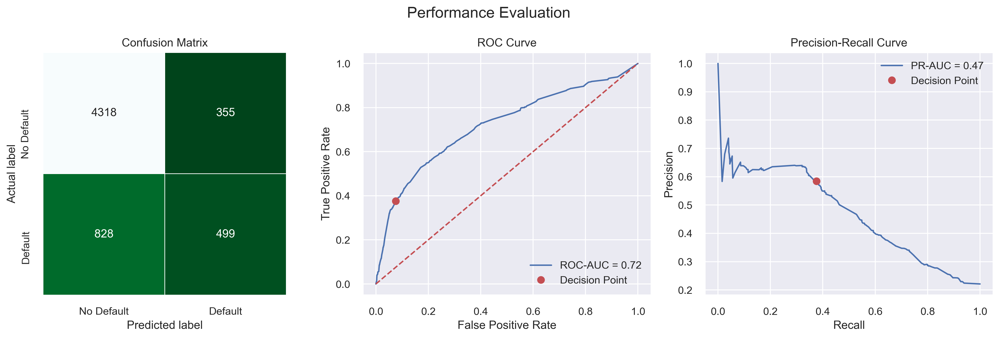

In [107]:
tree_rs_perf = performance_evaluation_report(classifier_rs, X_test, 
                                             y_test, labels=LABELS, 
                                             show_plot=True,
                                            show_pr_curve = True)

plt.tight_layout()
plt.show()

Bewertung unseres Algorithmus und Modells

In [79]:
tree_rs_perf

{'accuracy': 0.8028333333333333,
 'precision': 0.5843091334894613,
 'recall': 0.3760361718161266,
 'specificity': 0.9240316713032314,
 'f1_score': 0.45758826226501603,
 'cohens_kappa': 0.3439613201516819,
 'roc_auc': 0.7188330048148133,
 'pr_auc': 0.4686663337519278}

### Getting Ready

Prepare the Pipeline:

In [80]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.tree import DecisionTreeClassifier
from sklearn.pipeline import Pipeline
from performance import performance_evaluation_report

from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn import metrics

#### From here

### (RandomForestClassifier,  GradientBoostingClassifier)

### How to do it...

1. Import the libraries:

In [81]:
from sklearn.ensemble import (RandomForestClassifier, 
                              GradientBoostingClassifier)

2. Create a Random Forest Pipeline:

num_features = X_train.select_dtypes(include='number').columns.to_list()
cat_features = X_train.select_dtypes(include='object').columns.to_list()

num_pipeline = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median'))
])

cat_list = [list(X_train[column].dropna().unique()) for column in cat_features]

cat_pipeline = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(categories=cat_list, sparse=False, 
                             handle_unknown='error', drop='first'))
])

preprocessor = ColumnTransformer(transformers=[
    ('numerical', num_pipeline, num_features),
    ('categorical', cat_pipeline, cat_features)],
    remainder='drop')

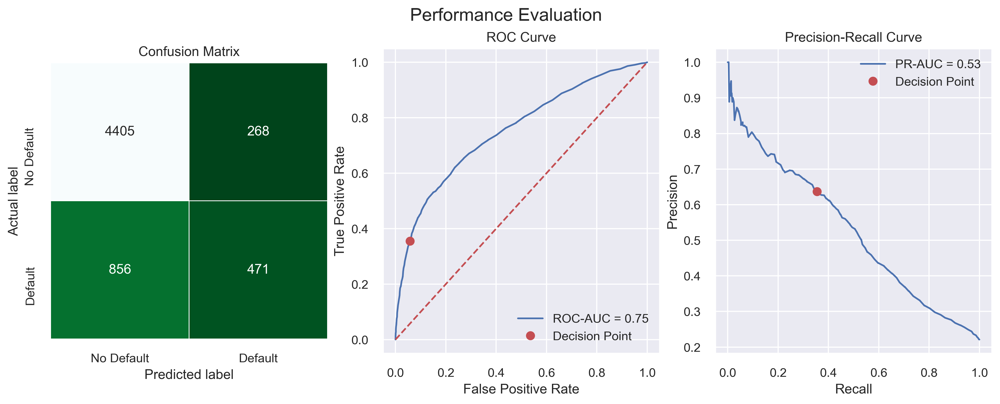

In [82]:
rf = RandomForestClassifier(random_state=42)  # I make an instance from the class
rf_pipeline = Pipeline(steps=[('preprocessor', preprocessor), 
                              ('classifier', rf)
                             ])

rf_pipeline.fit(X_train, y_train)

LABELS = ['No Default', 'Default']
rf_perf = performance_evaluation_report(rf_pipeline, X_test, 
                                        y_test, labels=LABELS, 
                                        show_plot=True,
                                        show_pr_curve=True)

plt.show()

In [83]:
rf_perf

{'accuracy': 0.8126666666666666,
 'precision': 0.6373477672530447,
 'recall': 0.3549359457422758,
 'specificity': 0.9426492617162422,
 'f1_score': 0.4559535333978703,
 'cohens_kappa': 0.3536945117892293,
 'roc_auc': 0.7521730520421391,
 'pr_auc': 0.5277687262649688}

### 3. Create a Gradient Boosting Trees Pipeline:

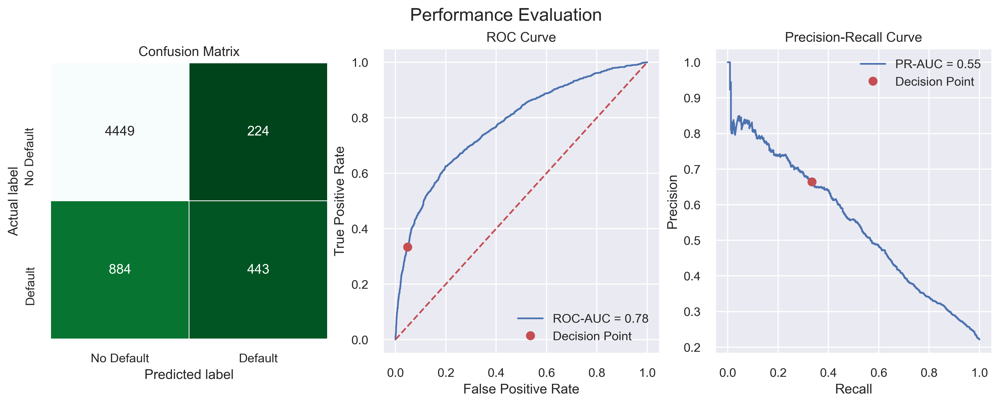

In [84]:
gbt =  GradientBoostingClassifier(random_state=42)
gbt_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                               ('classifier', gbt)
                              ])

gbt_pipeline.fit(X_train, y_train)

LABELS = ['No Default', 'Default']
gbt_perf = performance_evaluation_report(gbt_pipeline, X_test, 
                                         y_test, labels=LABELS, 
                                         show_plot=True,
                                         show_pr_curve=True)

plt.show()

In [85]:
gbt_perf

{'accuracy': 0.8153333333333334,
 'precision': 0.664167916041979,
 'recall': 0.333835719668425,
 'specificity': 0.9520650545687995,
 'f1_score': 0.4443329989969909,
 'cohens_kappa': 0.3478377308833953,
 'roc_auc': 0.7754929753263589,
 'pr_auc': 0.5484953190087277}

### There's more

Below we go over the most important hyperparameters of the considered models and show a possible way of tuning them using Randomized Search. With more complex models, the training time is significantly longer than with the basic Decision Tree, so we need to find a balance between the time we want to spend on tuning the hyperparameters and the expected results. Also, bear in mind that changing the values of some parameters (such as learning rate or the number of estimators) can itself influence the training time of the models.

To have the results in a reasonable amount of time, we used the Randomized Search with 100 different sets of hyperparameters for each model (the number of actually fitted models is higher due to cross-validation). Just as in the recipe *Grid Search and Cross-Validation*, we used recall as the criterion for selecting the best model. Additionally, we used the scikit-learn compatible APIs of XGBoost and LightGBM to make the process as easy to follow as possible. For a complete list of hyperparameters and their meaning, please refer to corresponding documentations.

In [86]:
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold
from sklearn import metrics
import numpy as np

N_SEARCHES = 100
k_fold = StratifiedKFold(5, shuffle=True, random_state=42)

**Random Forest**

When tuning the Random Forest classifier, we look at the following hyperparameters (there are more available for tuning):
#### * `n_estimators` - the number of decision trees in a forest.
#### * `max_features` - the maximum number of features considered for splitting a node. The default is the square root of the number of features. When None, all features are considered.
#### * `max_depth` - the maximum number of levels in each decision tree
#### * `min_samples_split` - the minimum number of observations required to split each node. When set to high it may cause underfitting, as the trees will not split enough times.
#### * `min_samples_leaf` - the minimum number of data points allowed in a leaf. Too small a value might cause overfitting, while large values might prevent the tree from growing and cause underfitting.
#### * `bootstrap` - whether to use bootstrapping for each tree in the forest

#### We define a grid below:

In [87]:
rf_param_grid = {'classifier__n_estimators': np.linspace(100, 1000, 10, dtype=int),
                 'classifier__max_features': ['log2', 'sqrt', None],
                 'classifier__max_depth': np.arange(3, 11, 1, dtype=int),
                 'classifier__min_samples_split': [2, 5, 10],
                 'classifier__min_samples_leaf': np.arange(1, 51, 2, dtype=int),
                 'classifier__bootstrap': [True, False]}

And use the randomized search to tune the classifier:

In [90]:
rf_rs =  RandomizedSearchCV(rf_pipeline, rf_param_grid, scoring='recall', 
                                       cv=k_fold, n_jobs=-1, verbose=1, 
                                       n_iter=N_SEARCHES, random_state=42)

rf_rs.fit(X_train, y_train)

print(f'Best parameters: {rf_rs.best_params_}') 
print(f'Recall (Training set): {rf_rs.best_score_:.4f}') 
print(f'Recall (Test set): {metrics.recall_score(y_test, rf_rs.predict(X_test)):.4f}')

Fitting 5 folds for each of 100 candidates, totalling 500 fits
Best parameters: {'classifier__n_estimators': 1000, 'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 11, 'classifier__max_features': None, 'classifier__max_depth': 9, 'classifier__bootstrap': False}
Recall (Training set): 0.3750
Recall (Test set): 0.3451


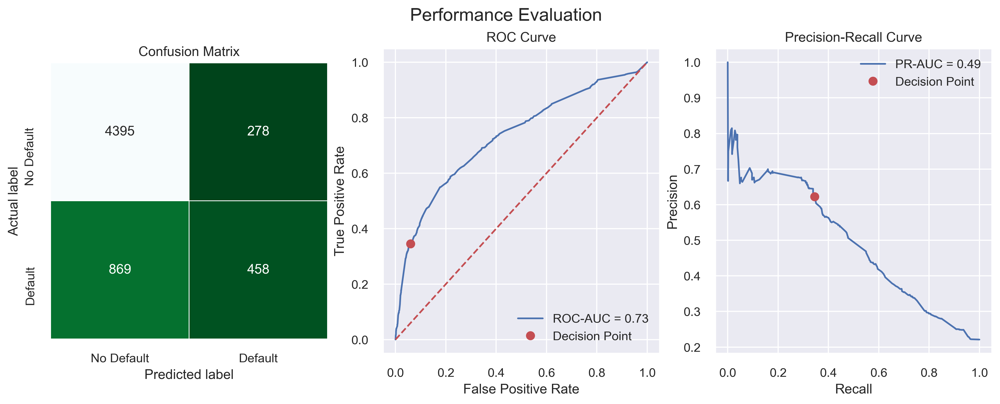

In [91]:
rf_rs_perf = performance_evaluation_report(rf_rs, X_test, 
                                           y_test, labels=LABELS, 
                                           show_plot=True,
                                           show_pr_curve=True)

In [92]:
rf_rs_perf

{'accuracy': 0.8088333333333333,
 'precision': 0.6222826086956522,
 'recall': 0.34513941220798794,
 'specificity': 0.9405093087952066,
 'f1_score': 0.4440135724672807,
 'cohens_kappa': 0.3398343312239752,
 'roc_auc': 0.7321475596715472,
 'pr_auc': 0.49177918264811576}

**Gradient Boosted Trees**

As Gradient Boosted Trees are also an ensemble method built on top of decision trees, a lot of the parameters are the same as in the case of the Random Forest. The new one is the learning rate, which is used in the gradient descent algorithm to control the rate of descent towards the minimum of the loss function. When tuning the tree manually, we should consider this hyperparameter together with the number of estimators, as reducing the learning rate (the learning is slower), while increasing the number of estimators can increase the computation time significantly.

We define the grid as follows:

In [93]:
gbt_param_grid = {'classifier__n_estimators': np.linspace(100, 1000, 10, dtype=int),
                  'classifier__learning_rate': np.arange(0.05, 0.31, 0.05),
                  'classifier__max_depth': np.arange(3, 11, 1, dtype=int),
                  'classifier__min_samples_split': np.linspace(0.1, 0.5, 12),
                  'classifier__min_samples_leaf': np.arange(1, 51, 2, dtype=int),
                  'classifier__max_features':['log2', 'sqrt', None]}

And run the randomized search:

In [94]:
gbt_rs =  RandomizedSearchCV(gbt_pipeline, gbt_param_grid, scoring='recall', 
                             cv=k_fold, n_jobs=-1, verbose=1, 
                             n_iter=N_SEARCHES, random_state=42)

gbt_rs.fit(X_train, y_train)

print(f'Best parameters: {gbt_rs.best_params_}') 
print(f'Recall (Training set): {gbt_rs.best_score_:.4f}') 
print(f'Recall (Test set): {metrics.recall_score(y_test, gbt_rs.predict(X_test)):.4f}')

Fitting 5 folds for each of 100 candidates, totalling 500 fits
Best parameters: {'classifier__n_estimators': 1000, 'classifier__min_samples_split': 0.2090909090909091, 'classifier__min_samples_leaf': 15, 'classifier__max_features': None, 'classifier__max_depth': 6, 'classifier__learning_rate': 0.25}
Recall (Training set): 0.3731
Recall (Test set): 0.3497


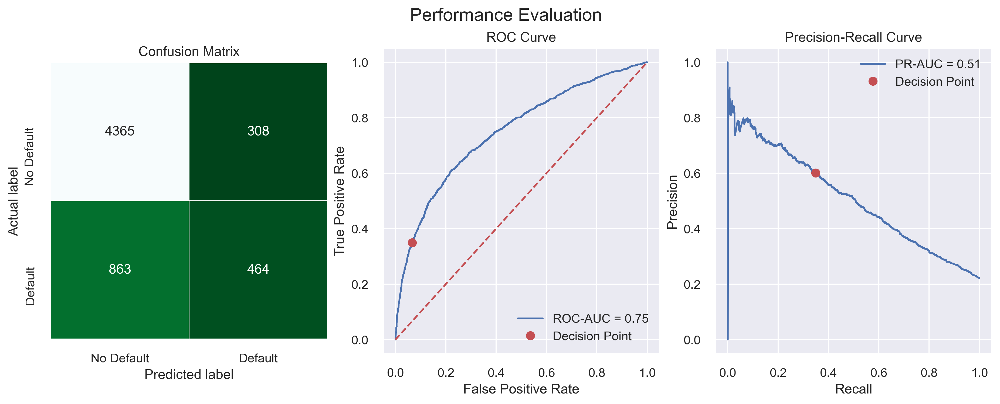

In [95]:
gbt_rs_perf = performance_evaluation_report(gbt_rs, X_test, 
                                            y_test, labels=LABELS, 
                                            show_plot=True,
                                            show_pr_curve=True)

In [96]:
gbt_rs_perf

{'accuracy': 0.8048333333333333,
 'precision': 0.6010362694300518,
 'recall': 0.3496608892238131,
 'specificity': 0.9340894500320993,
 'f1_score': 0.4421152929966651,
 'cohens_kappa': 0.33371973668937804,
 'roc_auc': 0.7496943673117111,
 'pr_auc': 0.5070296242054544}

Import the libraries:

In [97]:
from xgboost.sklearn import XGBClassifier # conda install -c conda-forge xgboost
from lightgbm import LGBMClassifier # conda install -c conda-forge lightgbm

4. Create a xgBoost Pipeline:

C:\Users\alfa\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[15:35:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


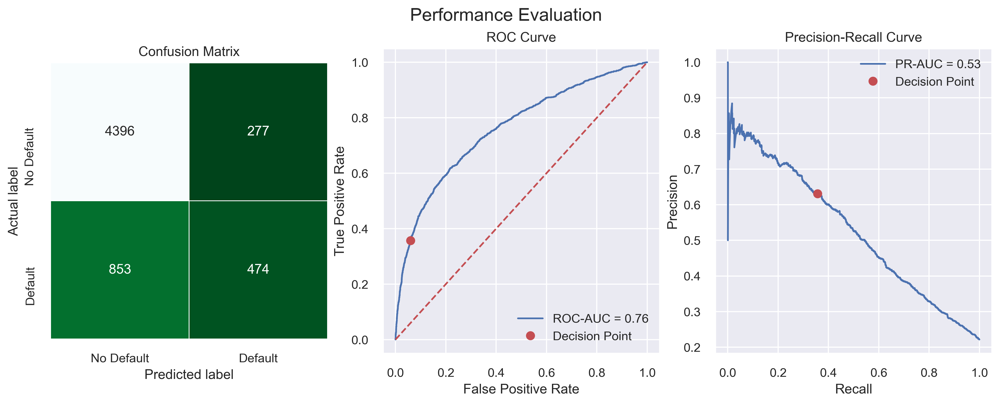

In [98]:
xgb = XGBClassifier(random_state=42)
xgb_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                               ('classifier', xgb)
                              ])

xgb_pipeline.fit(X_train, y_train)
xgb_perf = performance_evaluation_report(xgb_pipeline, X_test, 
                                         y_test, labels=LABELS, 
                                         show_plot=True,
                                         show_pr_curve=True)

# plt.savefig('images/ch9_im3.png', dpi=300)
plt.show()

5. Create a LightGBM classifier Pipeline:

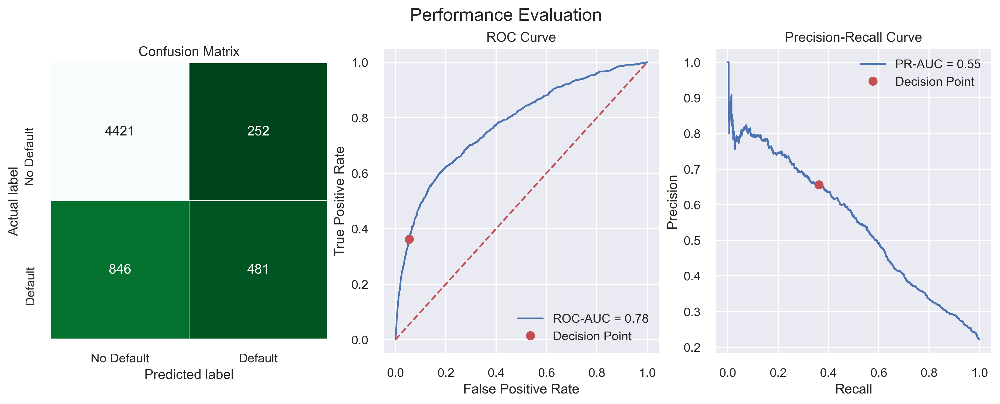

In [99]:
lgbm = LGBMClassifier(random_state=42)
lgbm_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                ('classifier', lgbm)
                               ])

lgbm_pipeline.fit(X_train, y_train)
lgbm_perf = performance_evaluation_report(lgbm_pipeline, X_test, 
                                          y_test, labels=LABELS, 
                                          show_plot=True,
                                          show_pr_curve=True)

# plt.savefig('images/ch9_im4.png', dpi=300)
plt.show()

**XGBoost**

The scikit-learn API of XGBoost makes sure that the hyperparameters are named similarly to their equivalents other scikit-learn's classifiers. So the XGBoost native eta hyperparameter is called learning_rate in scikit-learn's API. 

The new hyperparameters we consider for this example are:
* `min_child_weight` - indicates the minimum sum of weights of all observations required in a child. This hyperparameter is used for controlling overfitting. Cross-validation should be used for tuning.
* `colsample_bytree` - indicates the fraction of columns to be randomly sampled for each tree.

We define the grid as:

In [100]:
xgb_param_grid = {'classifier__n_estimators': np.linspace(100, 1000, 10, dtype=int),
                  'classifier__learning_rate': np.arange(0.05, 0.31, 0.05),
                  'classifier__max_depth': np.arange(3, 11, 1, dtype=int),
                  'classifier__min_child_weight': np.arange(1, 8, 1, dtype=int),
                  'classifier__colsample_bytree': np.linspace(0.3, 1, 7)}

For defining ranges of parameters that are restricted (such as colsample_bytree which cannot be higher than 1.0) it is better to use `np.linspace` rather than `np.arange`, because the latter allows for some inconsistencies when the step is defined as floating-point. For example, the last value might be 1.0000000002, which then causes an error while training the classifier.

In [101]:
xgb_rs =  RandomizedSearchCV(xgb_pipeline, # Estimator (either a "score" function or "scoring" must be calculated)
                             xgb_param_grid, # param_distributions: dict (the previous cell)
                             scoring='recall', # default=None, The score comes from the class "performance_evaluation_report()"
                             cv=k_fold, # determines the cross validation splitting strategy
                             n_jobs=-1, # number of jobs to run parallel. -1 means using all processors.
                             verbose=1, # the higher is the value the more messages
                             n_iter=N_SEARCHES, # iterations, in this case 100
                             random_state=42)

xgb_rs.fit(X_train, y_train)
# RSCV Att => cv_results_, best_estimator_, best_score_, best_params_, best_index_, scorer_ 
print(f'Best parameters: {xgb_rs.best_params_}') 
print(f'Recall (Training set): {xgb_rs.best_score_:.4f}') 
print(f'Recall (Test set): {metrics.recall_score(y_test, xgb_rs.predict(X_test)):.4f}')

Fitting 5 folds for each of 100 candidates, totalling 500 fits


C:\Users\alfa\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:22:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Best parameters: {'classifier__n_estimators': 600, 'classifier__min_child_weight': 5, 'classifier__max_depth': 9, 'classifier__learning_rate': 0.3, 'classifier__colsample_bytree': 1.0}
Recall (Training set): 0.3826
Recall (Test set): 0.3723


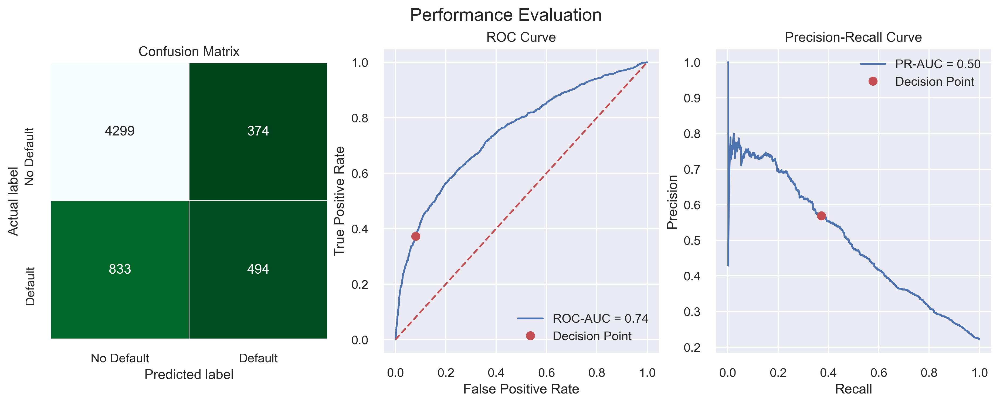

In [102]:
xgb_rs_perf = performance_evaluation_report(xgb_rs, X_test, 
                                            y_test, labels=LABELS, 
                                            show_plot=True,
                                            show_pr_curve=True)

**LightGBM**

We tune the same parameters as in XGBoost, though more is definitely possible and encouraged. The grid is defined as follows:

In [103]:
lgbm_param_grid = {'classifier__n_estimators': np.linspace(100, 1000, 10, dtype=int),
                   'classifier__learning_rate': np.arange(0.05, 0.31, 0.05),
                   'classifier__max_depth': np.arange(3, 11, 1, dtype=int),
                   'classifier__colsample_bytree': np.linspace(0.3, 1, 7)}

In [104]:
lgbm_rs =  RandomizedSearchCV(lgbm_pipeline, lgbm_param_grid, scoring='recall', 
                              cv=k_fold, n_jobs=-1, verbose=1, 
                              n_iter=N_SEARCHES, random_state=42)

lgbm_rs.fit(X_train, y_train)

print(f'Best parameters: {lgbm_rs.best_params_}') 
print(f'Recall (Training set): {lgbm_rs.best_score_:.4f}') 
print(f'Recall (Test set): {metrics.recall_score(y_test, lgbm_rs.predict(X_test)):.4f}')

Fitting 5 folds for each of 100 candidates, totalling 500 fits
Best parameters: {'classifier__n_estimators': 900, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.25, 'classifier__colsample_bytree': 0.8833333333333333}
Recall (Training set): 0.3758
Recall (Test set): 0.3723


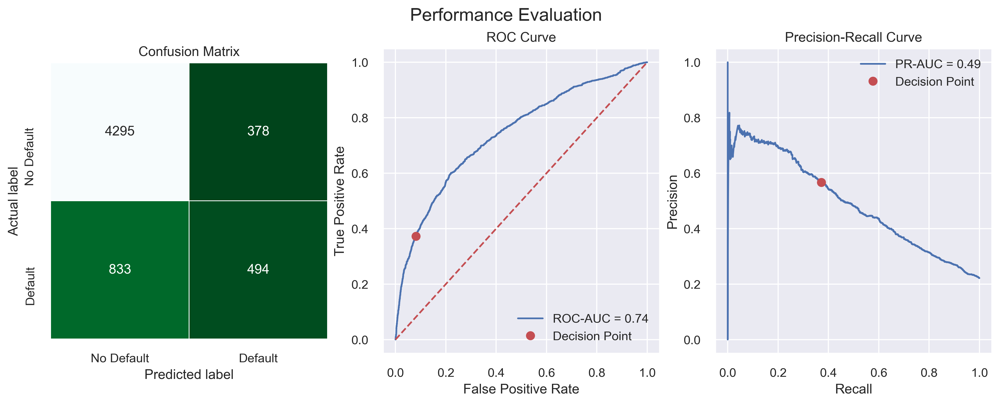

In [105]:
lgbm_rs_perf = performance_evaluation_report(lgbm_rs, X_test, 
                                             y_test, labels=LABELS, 
                                             show_plot=True,
                                             show_pr_curve=True)

Below we present a summary of all the classifiers we have considered in the last 3 recipes.

In [106]:
results_dict = {'decision_tree_baseline': tree_perf,
                'random_forest': rf_perf,
                'random_forest_rs': rf_rs_perf,
                'gradient_boosted_trees': gbt_perf,
                'gradient_boosted_trees_rs': gbt_rs_perf,
                'xgboost': xgb_perf,
                'xgboost_rs': xgb_rs_perf,
                'light_gbm': lgbm_perf,
                'light_gbm_rs': lgbm_rs_perf,
                'stacked ensembles': stack_clf_perf,}

results_comparison = pd.DataFrame(results_dict).T
results_comparison

,accuracy,precision,recall,specificity,f1_score,cohens_kappa,roc_auc,pr_auc
decision_tree_baseline,0.720333,0.377530,0.407687,0.809116,0.392029,0.210775,0.608983,0.458213
random_forest,0.812667,0.637348,0.354936,0.942649,0.455954,0.353695,0.752173,0.527769
random_forest_rs,0.808833,0.622283,0.345139,0.940509,0.444014,0.339834,0.732148,0.491779
gradient_boosted_trees,0.815333,0.664168,0.333836,0.952065,0.444333,0.347838,0.775493,0.548495
gradient_boosted_trees_rs,0.804833,0.601036,0.349661,0.934089,0.442115,0.333720,0.749694,0.507030
xgboost,0.811667,0.631158,0.357197,0.940723,0.456208,0.352735,0.760476,0.527454
xgboost_rs,0.798833,0.569124,0.372268,0.919966,0.450114,0.333538,0.742334,0.497010
light_gbm,0.817000,0.656207,0.362472,0.946073,0.466990,0.367428,0.775582,0.548010
light_gbm_rs,0.798167,0.566514,0.372268,0.919110,0.449295,0.332151,0.741661,0.490796


In [109]:
results_dict2 = {'stacked ensembles': stack_clf_perf,
               }

results_comparison2 = pd.DataFrame(results_dict2).T
results_comparison2

,accuracy,cohens_kappa,f1_score,pr_auc,precision,recall,roc_auc,specificity
stacked ensembles,0.815453,0.349696,0.446544,0.519818,0.66322,0.336582,0.754262,0.951458
